# Load Data

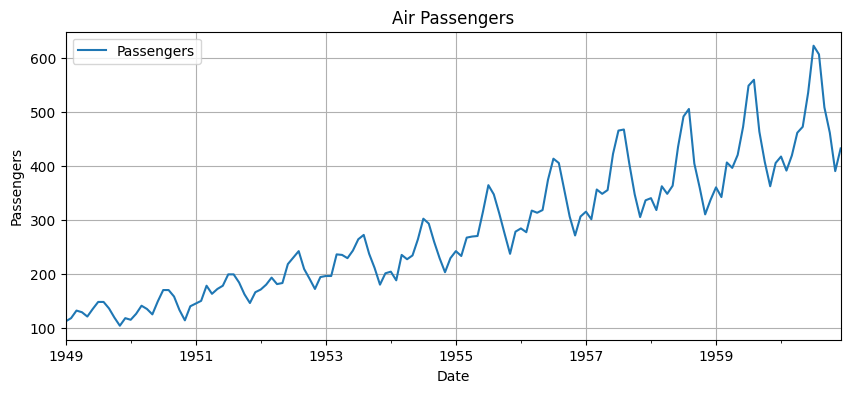

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")


# Load the AirPassengers dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/airline-passengers.csv"
df = pd.read_csv(url, parse_dates=['Month'], index_col='Month')

# Visualize the series
df.plot(figsize=(10, 4), title="Air Passengers")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.grid()
plt.show()

# Split Data

In [2]:
def create_time_series_features(data, lookback_window=12):
    """
    Create features for time series forecasting using lagged values
    """
    X, y = [], []
    
    for i in range(lookback_window, len(data)):
        # Use previous 'lookback_window' values as features
        X.append(data[i-lookback_window:i])
        y.append(data[i])
    
    return np.array(X), np.array(y)

In [3]:
lag = 12
X = df['Passengers'][:-lag]
y = df['Passengers'][lag:]

# Define sizes
n = len(X)
train_size = int(n * 0.7)
val_size = int(n * 0.15)
test_size = n - train_size - val_size

# Split the series
X_train = X[:train_size]
y_train = y[:train_size]
X_val = X[train_size:train_size + val_size]
y_val = y[train_size:train_size + val_size]
X_test = X[train_size + val_size:]
y_test = y[train_size + val_size:]

# Confirm sizes
print(f"Train starts on: {X_train.index[0]}, Train ends on: {X_train.index[-1]}")
print(f"Validation starts on: {X_val.index[0]}, Validation ends on: {X_val.index[-1]}")
print(f"Test starts on: {X_test.index[0]}, Test ends on: {X_test.index[-1]}")
print(f"Train size: {len(X_train)}, Val size: {len(X_val)}, Test size: {len(X_test)}")

Train starts on: 1949-01-01 00:00:00, Train ends on: 1956-08-01 00:00:00
Validation starts on: 1956-09-01 00:00:00, Validation ends on: 1958-03-01 00:00:00
Test starts on: 1958-04-01 00:00:00, Test ends on: 1959-12-01 00:00:00
Train size: 92, Val size: 19, Test size: 21


In [4]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_scaled = scaler_X.fit_transform(np.array(X_train).reshape(-1,1))
X_val_scaled = scaler_X.transform(np.array(X_val).reshape(-1,1))
y_train_scaled = scaler_y.fit_transform(np.array(y_train).reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(np.array(y_val).reshape(-1, 1)).ravel()


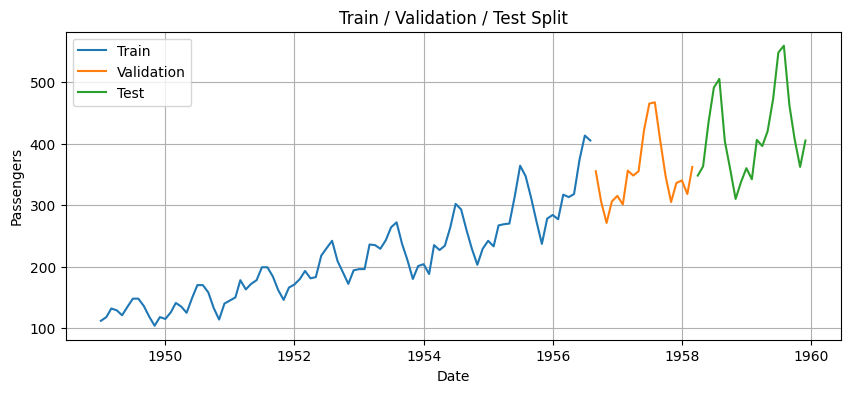

In [5]:
plt.figure(figsize=(10, 4))
plt.plot(X_train, label="Train")
plt.plot(X_val, label="Validation")
plt.plot(X_test, label="Test")
plt.title("Train / Validation / Test Split")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.legend()
plt.grid()
plt.show()

# Base Models

In [6]:
from abc import ABC, abstractmethod
from statsmodels.tsa.arima.model import ARIMA
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from copy import deepcopy

class AbstractBaseModel (ABC):

    def __init__(self, model, hparams, *args, **kwagrs):
        self.model = model
        self.hparams = hparams
        self.fitness_score = 0.0
        self.forecast = None

    @abstractmethod
    def train(self, X_train, y_train):
        raise NotImplementedError("Subclasses must implement train method")

    @abstractmethod
    def predict(self, X_test):
        raise NotImplementedError("Subclasses must implement predict method")

    @abstractmethod
    def get_name(self):
        raise NotImplementedError("Subclasses must implement get_name method")
    
    @abstractmethod
    def crossover(self, other):
        raise NotImplementedError("Subclasses must implement crossover method")

    @abstractmethod
    def mutate(self):
        raise NotImplementedError("Subclasses must implement mutate method")
    
    def calculate_fitness(self, pred, y_test, diversity_score):
        alpha = 0.9
        beta = 0.1
        self.fitness_score = (alpha * 1/(np.sqrt(mean_squared_error(y_test, pred)) + 1e-8)) + (beta * diversity_score)
        return self.fitness_score
    
    def __str__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)
    
    def __repr__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)


class ArimaModel(AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
    
    def train(self, X_train, y_train):
        p = self.hparams['p']
        d = self.hparams['d']
        q = self.hparams['q']
        self.model = ARIMA(X_train, order=(p, d, q)).fit()
    
    def predict(self, X_test):
        self.forecast = self.model.forecast(steps=len(X_test))
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'arima'
    
    def crossover(self, other):
        if not isinstance(other, ArimaModel):
            raise ValueError("Can only crossover with another ArimaModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['p'], child2.hparams['p'] = child2.hparams['p'], child1.hparams['p']
        if np.random.random() < 0.5:
            child1.hparams['d'], child2.hparams['d'] = child2.hparams['d'], child1.hparams['d']
        if np.random.random() < 0.5:
            child1.hparams['q'], child2.hparams['q'] = child2.hparams['q'], child1.hparams['q']
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['p', 'd', 'q'])
        
        if mutation_param == 'p':
            self.hparams['p'] = np.random.randint(0, 5)
        elif mutation_param == 'd':
            self.hparams['d'] = np.random.randint(0, 2)
        elif mutation_param == 'q':
            self.hparams['q'] = np.random.randint(0, 5)
        
        self.fitness_score = 0.0
        
        return self

class SVRModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        kernel = self.hparams['kernel']
        c = self.hparams['c']
        gamma = self.hparams['gamma']
        epsilon = self.hparams['epsilon']
        self.model = SVR(kernel=kernel, C=c, gamma=gamma, epsilon=epsilon)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'svr'
    
    def crossover(self, other):
        if not isinstance(other, SVRModel):
            raise ValueError("Can only crossover with another SVRModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['kernel'], child2.hparams['kernel'] = child2.hparams['kernel'], child1.hparams['kernel']
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            c1, c2 = child1.hparams['c'], child2.hparams['c']
            child1.hparams['c'] = alpha * c1 + (1 - alpha) * c2
            child2.hparams['c'] = alpha * c2 + (1 - alpha) * c1
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            eps1, eps2 = child1.hparams['epsilon'], child2.hparams['epsilon']
            child1.hparams['epsilon'] = alpha * eps1 + (1 - alpha) * eps2
            child2.hparams['epsilon'] = alpha * eps2 + (1 - alpha) * eps1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['kernel', 'c', 'epsilon'])
        
        if mutation_param == 'kernel':
            self.hparams['kernel'] = np.random.choice(["linear", "rbf", "poly"])
        
        elif mutation_param == 'c':
            current_c = self.hparams['c']
            noise = np.random.normal(0, current_c * 0.1)  # 10% noise
            self.hparams['c'] = max(0.1, min(100, current_c + noise))
        
        elif mutation_param == 'epsilon':
            current_eps = self.hparams['epsilon']
            noise = np.random.normal(0, current_eps * 0.1)  # 10% noise
            self.hparams['epsilon'] = max(0.001, min(0.5, current_eps + noise))

        self.fitness_score = 0.0
        
        return self
    
class MLPModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        hidden_layer_sizes = self.hparams['hidden_layer_sizes']
        learning_rate = self.hparams['learning_rate']
        
        hidden_layer_sizes = (int(hidden_layer_sizes),)
        
        self.model = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes,
                            learning_rate_init=learning_rate,
                            max_iter=500, random_state=42)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'mlp'
    
    def crossover(self, other):
        if not isinstance(other, MLPModel):
            raise ValueError("Can only crossover with another MLPModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            h1, h2 = child1.hparams['hidden_layer_sizes'], child2.hparams['hidden_layer_sizes']
            child1.hparams['hidden_layer_sizes'] = int(alpha * h1 + (1 - alpha) * h2)
            child2.hparams['hidden_layer_sizes'] = int(alpha * h2 + (1 - alpha) * h1)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            lr1, lr2 = child1.hparams['learning_rate'], child2.hparams['learning_rate']
            child1.hparams['learning_rate'] = alpha * lr1 + (1 - alpha) * lr2
            child2.hparams['learning_rate'] = alpha * lr2 + (1 - alpha) * lr1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['hidden_layer_sizes', 'learning_rate'])
        
        if mutation_param == 'hidden_layer_sizes':
            current_size = self.hparams['hidden_layer_sizes']
            change = np.random.randint(-10, 11)  # Change by -10 to +10
            self.hparams['hidden_layer_sizes'] = max(5, min(50, current_size + change))
        
        elif mutation_param == 'learning_rate':
            current_lr = self.hparams['learning_rate']
            noise = np.random.normal(0, current_lr * 0.1)  # 10% noise
            self.hparams['learning_rate'] = max(0.001, min(0.1, current_lr + noise))

        self.fitness_score = 0.0
        
        return self

    
class EnsembleModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        for model in self.hparams.keys():
            self.hparams[model].train(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = 0.0
        for model in self.hparams.keys():
            self.forecast += self.hparams[model].predict(X_test)
        self.forecast /= len(self.hparams.keys()) # Average of all predictions
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'ensemble'
    
    def crossover(self, other):
        return self, other
    
    def mutate(self):
        return self


# Model Diversity and Evaluation

In [7]:
def print_population(population):
    for model in population.keys():
        for individual in population[model]:
            print(individual)
    print('============================\n\n')


def init_population(population_size, pool_of_models):
    population = {}

    for model in pool_of_models:
        population[model.get_name()] = []
        if model is ArimaModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    ArimaModel(
                        ARIMA,
                        {
                            'p': np.random.randint(0, 5),
                            'd': np.random.randint(0, 2),
                            'q': np.random.randint(0, 5)
                        }
                    )
                )
        elif model is SVRModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    SVRModel(
                        SVR,
                        {
                            'kernel' : np.random.choice(["linear", "rbf", "poly"]),
                            'c' : np.random.uniform(0.1, 100),
                            'gamma': np.random.choice(['scale']),
                            'epsilon' : np.random.uniform(0.001, 0.5)
                        }
                    )
                )
        elif model is MLPModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    MLPModel(
                        MLPRegressor,
                        {
                            'hidden_layer_sizes': np.random.randint(5, 50),
                            'learning_rate': np.random.uniform(0.001, 0.1)
                        }
                    )
                )
    
    return population

In [8]:
from itertools import zip_longest


def individual_diversity(population, X_test):
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model in population.keys():
        model_names.append(model)
        model_predictions[model] = []
        for individual in population[model]:
            model_predictions[model].append(individual.predict(X_test))
    
    # Convert to numpy array for easier computation
    pred_matrix = [list(lst) for lst in zip_longest(*model_predictions.values(), fillvalue=None)]
    
    # Calculate pairwise disagreements using MSE
    n_rows, n_cols = np.shape(pred_matrix)[0:2]
    disagreement_matrix = np.zeros((n_rows, n_cols))

    for i in range(n_rows):  # For each model instance (row)
        for j in range(n_cols):  # For each model type (column)
            ref_pred = pred_matrix[i][j]
            mse_list = []
            for k in range(n_cols):
                if k != j:
                    comp_pred = pred_matrix[i][k]
                    mse = mean_squared_error(ref_pred, comp_pred)
                    mse_list.append(mse)
            disagreement_matrix[i][j] = np.mean(mse_list)
    
    return disagreement_matrix

In [9]:
def individual_evaluation_with_diversity(population, X_train, y_train, X_val, y_val):

    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            # individual.calculate_fitness(pred, y_val)

    disagreement_matrix = individual_diversity(population, X_val)

    i = 0
    for model in population.keys():
        j = 0
        for individual in population[model]:
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val, disagreement_matrix[j][i])
            j +=1
        i += 1


In [10]:
def individual_evaluation(population, X_train, y_train, X_val, y_val):

    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val)


In [11]:
from itertools import combinations


def calculate_model_diversity(models_dict, X_test):
    """
    Calculate disagreement measure (diversity) for ensemble models using MSE.
    
    Parameters:
    -----------
    models_dict : dict
        Dictionary with model names as keys and trained model objects as values
        Format: {'model_name': model_object, ...}
    X_test : array-like
        Test data for generating predictions
    
    Returns:
    --------
    float : Average disagreement measure across all model pairs
    dict : Dictionary with detailed diversity metrics and model predictions
    """
    
    if len(models_dict) < 2:
        raise ValueError("Need at least 2 models to calculate diversity")
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model_name, model_obj in models_dict.items():
        predictions = model_obj.predict(X_test)
        model_predictions[model_name] = predictions
        model_names.append(model_name)
        # print(f"  {model_name}: predictions generated")
    
    # Convert to numpy array for easier computation
    pred_matrix = np.column_stack([model_predictions[name] for name in model_names])
    n_models = len(model_names)
    
    # Calculate pairwise disagreements using MSE
    pairwise_disagreements = []
    disagreement_matrix = np.zeros((n_models, n_models))
    model_pairs = []
    
    # print("\nCalculating pairwise disagreements...")
    for i, j in combinations(range(n_models), 2):
        model_i = model_names[i]
        model_j = model_names[j]
        pred_i = pred_matrix[:, i]
        pred_j = pred_matrix[:, j]
        
        disagreement = mean_squared_error(pred_i, pred_j)
        pairwise_disagreements.append(disagreement)
        disagreement_matrix[i, j] = disagreement
        disagreement_matrix[j, i] = disagreement  # Symmetric matrix
        model_pairs.append((model_i, model_j))
        
        # print(f"  {model_i} vs {model_j}: MSE = {disagreement:.6f}")
    
    # Calculate overall diversity measure
    avg_disagreement = np.mean(pairwise_disagreements)
    
    # Additional diversity statistics
    diversity_stats = {
        'average_disagreement': avg_disagreement,
        'pairwise_disagreements': pairwise_disagreements,
        'disagreement_matrix': disagreement_matrix,
        'model_pairs': model_pairs,
        'min_disagreement': np.min(pairwise_disagreements),
        'max_disagreement': np.max(pairwise_disagreements),
        'std_disagreement': np.std(pairwise_disagreements),
        'n_pairs': len(pairwise_disagreements),
        'model_names': model_names,
        'individual_predictions': model_predictions
    }
    
    return avg_disagreement, diversity_stats

In [12]:
def plot_forecasts(models, actual):
    plt.figure(figsize=(10, 4))
    plt.plot(actual, label='Actual')
    for model in models:
        plt.plot(model.forecast, label= model.get_name())
    # plt.xlabel("Date")
    # plt.ylabel("Passengers")
    plt.grid()
    plt.legend()
    plt.show()


In [13]:
def team_evaluation(population, X_test, y_test):
    alpha = 0.8
    beta = 0.2

    best_models = {}
    # Select the best individual of each subpopulation
    for model in population.keys():
        best_ind = None
        for individual in population[model]:
            best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
        
        best_models[best_ind.get_name()] = best_ind
    
    ensemble = EnsembleModel(None, best_models)
    pred = ensemble.predict(X_test)

    models = best_models.copy()
    models['ensemble'] = ensemble
    plot_forecasts(models.values(), y_test)

    diversity_score, _ = calculate_model_diversity(best_models, X_test)
    fitness_score = (alpha * (1/(np.sqrt(mean_squared_error(pred, y_test) + 1e-8)))) + (beta * diversity_score)

    return fitness_score, best_models, pred, ensemble


# Genetic Algorithm Operators

In [14]:
from copy import deepcopy


def tournament_selection(population, tournament_size=3):
    selected_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        selected_population[model_type] = []
        
        # Perform tournament selection to maintain population size
        for _ in range(population_size):
            # Randomly select tournament_size individuals
            tournament_indices = np.random.choice(population_size, 
                                                size=min(tournament_size, population_size), 
                                                replace=False)
            
            # Find the individual with highest fitness in the tournament
            best_individual = None
            best_fitness = -1
            
            for idx in tournament_indices:
                individual = model_list[idx]
                if individual.fitness_score > best_fitness:
                    best_fitness = individual.fitness_score
                    best_individual = individual
            
            # Add a deep copy to avoid reference issues
            selected_population[model_type].append(deepcopy(best_individual))
    
    return selected_population

In [15]:
def crossover(population, crossover_rate=0.8):
    new_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        new_population[model_type] = []
        
        # Process pairs of individuals
        for i in range(0, population_size - 1, 2):
            parent1 = model_list[i]
            parent2 = model_list[i + 1]
            
            # Decide whether to perform crossover
            if np.random.random() < crossover_rate:
                # Use the crossover method of the object
                child1, child2 = parent1.crossover(parent2)
                new_population[model_type].extend([child1, child2])
            else:
                # No crossover, just copy parents
                new_population[model_type].extend([deepcopy(parent1), deepcopy(parent2)])
        
        # Handle odd population size
        if population_size % 2 == 1:
            new_population[model_type].append(deepcopy(model_list[-1]))
    
    return new_population

In [16]:
def mutation(population, mutation_rate=0.2):
    mutated_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        mutated_population[model_type] = []
        
        for individual in model_list:
            # Decide whether to mutate this individual
            if np.random.random() < mutation_rate:
                # Use the mutate method of the object
                mutated_individual = individual.mutate()
                mutated_population[model_type].append(mutated_individual)
            else:
                # No mutation, just copy the individual
                mutated_population[model_type].append(deepcopy(individual))
    
    return mutated_population

# Cooperative CoEvolutional Algorithm

Initializing population...
Population created: 
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 0.0
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.0
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 0.0
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 0.0
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.0
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 0.0
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 0.0
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.0
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 0.0
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 7.422846326181632, 'gamma': 'scale', 'epsilon': 0.17824374821249117} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 60.874815065980485, 'gamma': 'scale', 'epsilon': 0.14705960105420562} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 8.969167601150875, 'gamma': 'scale', 'epsilon': 0.011155766465648628} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 20.4224459318329, 'gamma': 'scale', 'epsilon': 0.008369774392435091} Fitness: 0.0
S

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.141326349028978
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.8322073928653302
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.2769898119294316
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 1.6940768984851893
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 1.5784368794835875
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.9460998978705664
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 1.2300969665923247
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8581402349951704
ArimaModel {'p': 1, 'd': 1, 'q': 4} Fitness: 1.146919263413996
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.0781410508200546
SVRModel {'kernel': 'poly', 'c': 7.422846326181632, 'gamma': 'scale', 'epsilon': 0.17824374821249117} Fitness: 1.7897930192175913
SVRModel {'kernel': 'rbf', 'c': 60.874815065980485, 'gamma': 'scale', 'epsilon': 0.14705960105420562} Fitness: 1.4532620294612202
SVRModel {'kernel': 'poly', 'c': 8.969167601150875, 'gamma': 'scale', 'epsilon': 0.011155766465648628}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


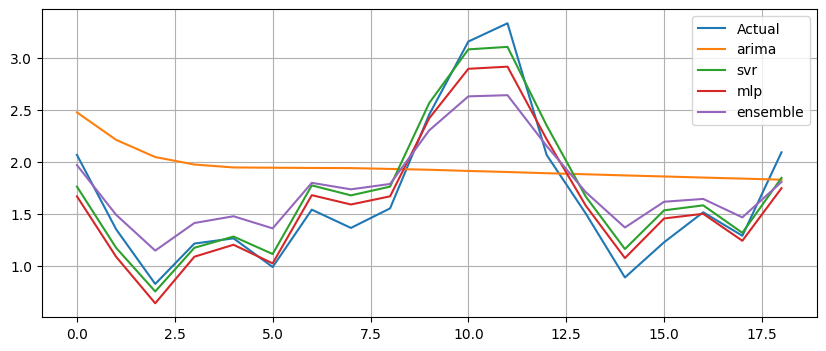

Generation 1: Fitness = 2.56212




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.1358676700032913
ArimaModel {'p': 1, 'd': 0, 'q': 4} Fitness: 2.2619534600558384
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 1.8871962068172556
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 2.1391906044109374
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.277791095100379
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 2.0750685526166937
ArimaModel {'p': 0, 'd': 1, 'q': 0} Fitness: 1.6887039931505452
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.124240417924357
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811682847383023
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.8933523851454632
SVRModel {'kernel': 'poly', 'c': 7.422846326181632, 'gamma': 'scale', 'epsilon': 0.17824374821249117} Fitness: 1.8553064308611917
SVRModel {'kernel': 'poly', 'c': 8.969167601150875, 'gamma': 'scale', 'epsilon': 0.011155766465648628} Fitness: 2.044138081642904
SVRModel {'kernel': 'poly', 'c': 20.4224459318329, 'gamma': 'scale', 'epsilon': 0.009978471776502466} 

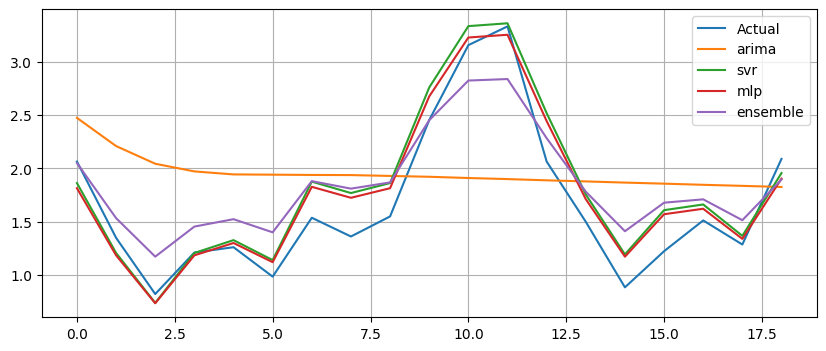

Generation 2: Fitness = 2.55672




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.288177400139558
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.282873973161035
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.084992231081431
ArimaModel {'p': 1, 'd': 1, 'q': 2} Fitness: 1.7675056257553141
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 1.0820920530344371
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2696184792450016
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 2.0775510367374634
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 2.1010520832973176
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.2769898119294316
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.279359738472629
SVRModel {'kernel': 'poly', 'c': 15.493462327841172, 'gamma': 'scale', 'epsilon': 0.009997355757696962} Fitness: 2.0056789393538113
SVRModel {'kernel': 'poly', 'c': 13.898151205142604, 'gamma': 'scale', 'epsilon': 0.01102532507831618} Fitness: 2.027550096883587
SVRModel {'kernel': 'linear', 'c': 20.83316551496521, 'gamma': 'scale', 'epsilon': 0.05166208497144890

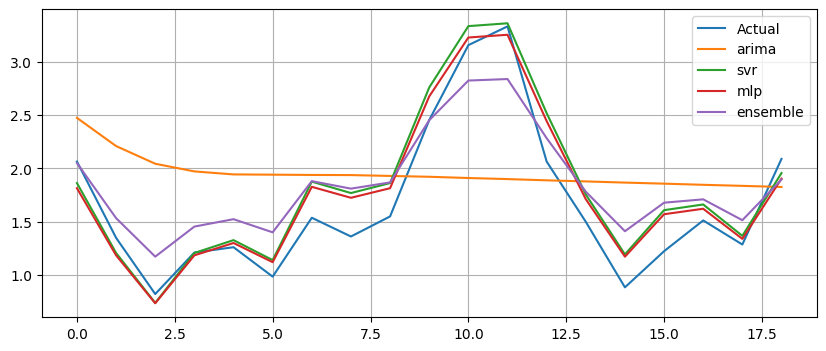

Generation 3: Fitness = 2.55672




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2502985497277708
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0891348275402417
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2562444193698656
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.9204984747495888
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2491477816813006
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2470287619373348
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2490397228885086
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2495601375486025
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 2.2760372513075486
ArimaModel {'p': 1, 'd': 1, 'q': 2} Fitness: 1.1094235879451153
SVRModel {'kernel': 'linear', 'c': 58.616244252012144, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6703827432401637
SVRModel {'kernel': 'linear', 'c': 20.83316551496521, 'gamma': 'scale', 'epsilon': 0.051662084971448904} Fitness: 2.25757680946737
SVRModel {'kernel': 'linear', 'c': 20.4224459318329, 'gamma': 'scale', 'epsilon': 0.1890770153362

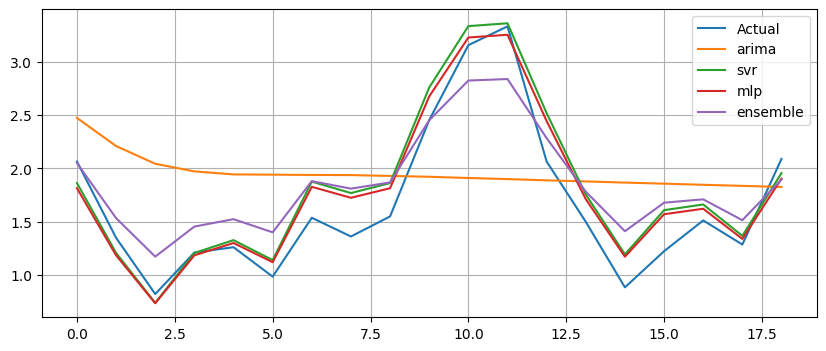

Generation 4: Fitness = 2.55672




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2458011576666452
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212121955823
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2502811805405292
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212121955823
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2407368870850963
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.261020424899487
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2537440062745147
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2506083783300623
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.24362121773064
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2458010949915388
SVRModel {'kernel': 'linear', 'c': 20.83316551496521, 'gamma': 'scale', 'epsilon': 0.051662084971448904} Fitness: 2.2550875102729857
SVRModel {'kernel': 'linear', 'c': 58.616244252012144, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6676667393288076
SVRModel {'kernel': 'linear', 'c': 20.83316551496521, 'gamma': 'scale', 'epsilon': 0.0540473422926

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


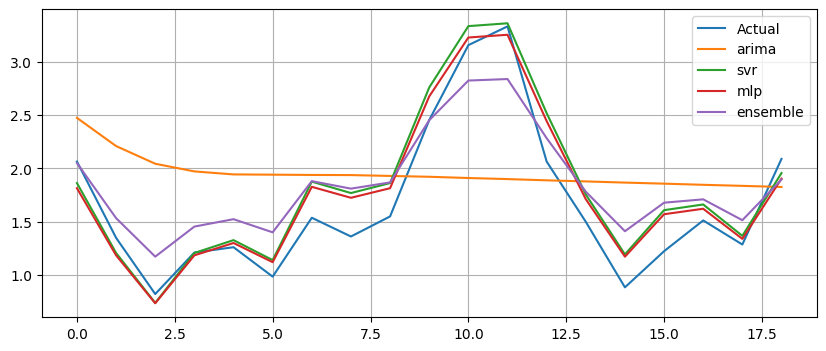

Generation 5: Fitness = 2.55672




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.24362121773064
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212150359938
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.0903268352937456
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0962359747993953
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2585370885003302
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212122782158
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212168382834
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.243621212645171
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212146135885
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212128333393
SVRModel {'kernel': 'linear', 'c': 17.841735914994196, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6676632766705195
SVRModel {'kernel': 'linear', 'c': 37.692268553953, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6676649624074003
SVRModel {'kernel': 'linear', 'c': 36.79689709119535, 'gamma': 'scale', 'epsilon': 0.4087441290120407}

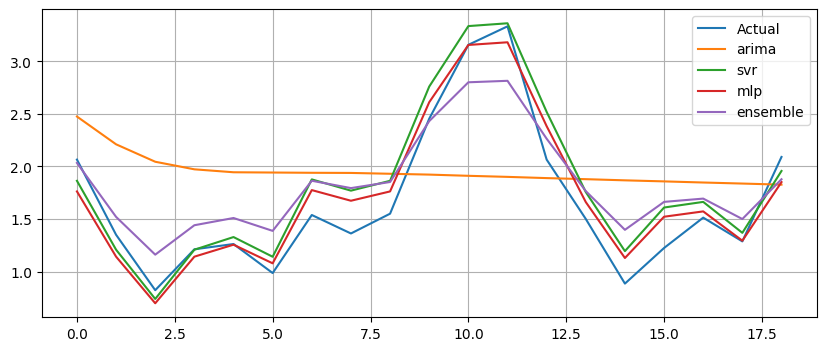

Generation 6: Fitness = 2.61599




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2466013684620532
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212121955823
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.243865916048677
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2321494956919492
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436212151300692
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637678391995
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436611141005867
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440007036726368
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0797743837604503
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.243737303031354
SVRModel {'kernel': 'linear', 'c': 58.616244252012144, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6700718480208554
SVRModel {'kernel': 'linear', 'c': 58.616244252012144, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6676667393288076
SVRModel {'kernel': 'linear', 'c': 46.69267146724623, 'gamma': 'scale', 'epsilon': 0.4087441290120

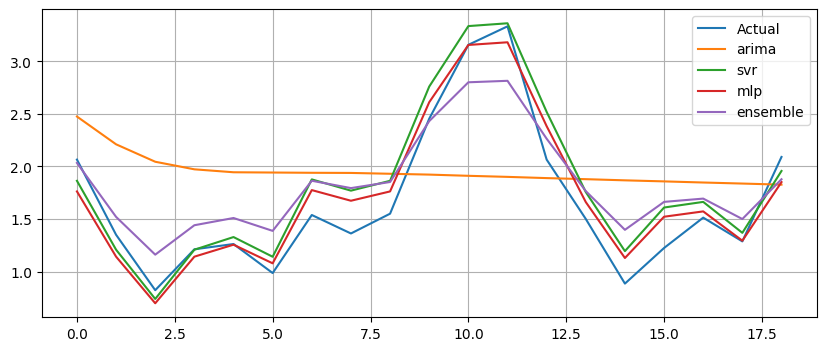

Generation 7: Fitness = 2.61599




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440336806156038
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244018152173309
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2438844226591044
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.092907013285466
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440007025543889
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637678391995
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.0902899285333416
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0890071728511885
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2437373042039508
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2437373030857028
SVRModel {'kernel': 'linear', 'c': 46.69267146724623, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.668033522276636
SVRModel {'kernel': 'linear', 'c': 58.616244252012144, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680225146000693
SVRModel {'kernel': 'linear', 'c': 46.553927964577056, 'gamma': 'scale', 'epsilon': 0.40874412901204

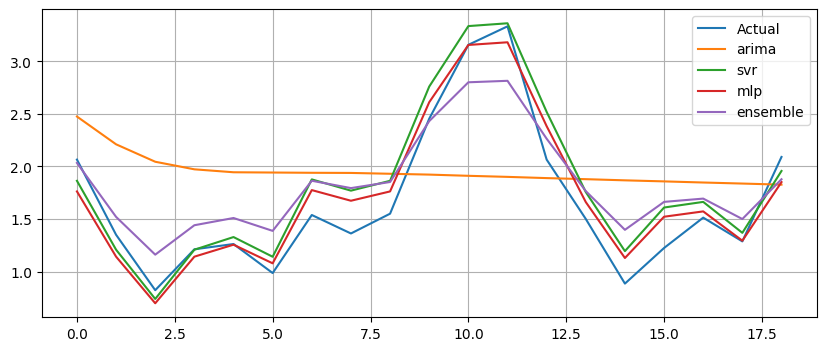

Generation 8: Fitness = 2.61599




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637678391995
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637651379796
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440732251757958
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440095885431186
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440181534982506
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244063767304974
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.243995936389079
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.931217445734793
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440007055167595
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244009590182223
SVRModel {'kernel': 'linear', 'c': 36.79689709119535, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680740452736393
SVRModel {'kernel': 'linear', 'c': 56.69308900085296, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680757341306145
SVRModel {'kernel': 'linear', 'c': 48.85921337863044, 'gamma': 'scale', 'epsilon': 0.4087441290120407}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


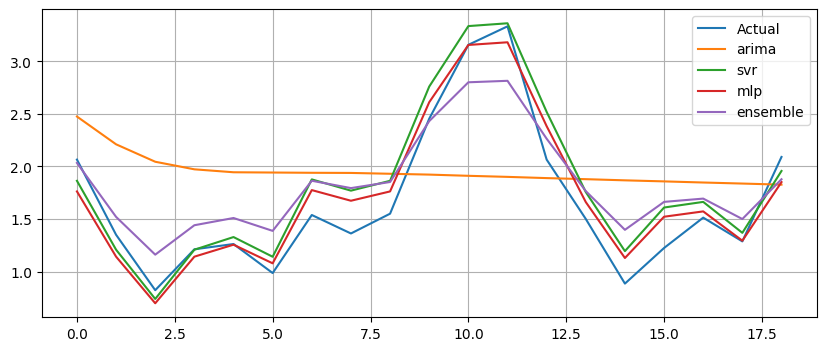

Generation 9: Fitness = 2.61599




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637643047594
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078189167647
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2495225310335414
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244063767304974
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440181539480921
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0856884410698833
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637651379796
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.9353480638678255
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637662017706
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436619999017748
SVRModel {'kernel': 'linear', 'c': 62.830518568900345, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680762550812327
SVRModel {'kernel': 'linear', 'c': 56.69308900085296, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680709004284706
SVRModel {'kernel': 'linear', 'c': 56.69308900085296, 'gamma': 'scale', 'epsilon': 0.4087441290120

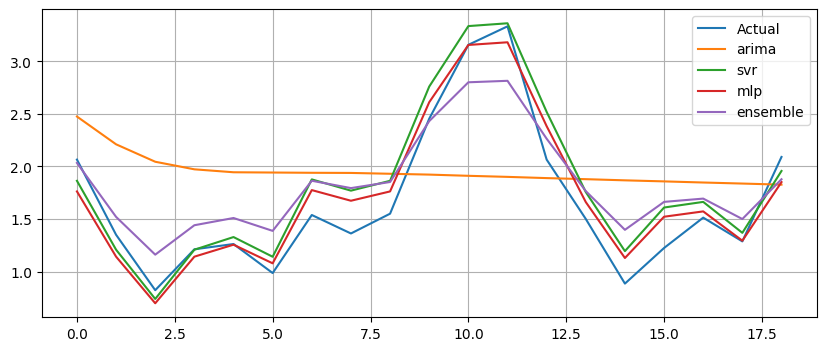

Generation 10: Fitness = 2.61599




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244207820383533
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244018153787923
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078199805557
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078189167647
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0931801809044215
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078192721442
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078189167647
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2325003392840923
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637651379796
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440637651379796
SVRModel {'kernel': 'linear', 'c': 45.8906390484582, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680699833924053
SVRModel {'kernel': 'linear', 'c': 46.72175778145177, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.668021505020728
SVRModel {'kernel': 'linear', 'c': 48.85921337863044, 'gamma': 'scale', 'epsilon': 0.4087441290120407}

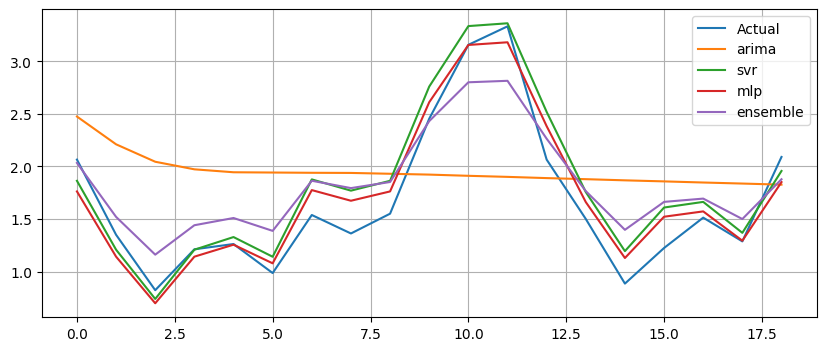

Generation 11: Fitness = 2.61599




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440883453393476
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440738573083563
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2324779634152847
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2695183725006787
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.9354681266943001
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442154356925335
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078189167647
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246950008583596
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440427804021157
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440227172597247
SVRModel {'kernel': 'linear', 'c': 56.69308900085296, 'gamma': 'scale', 'epsilon': 0.3910197805471457} Fitness: 3.467312643793407
SVRModel {'kernel': 'linear', 'c': 56.69308900085296, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.667962491589386
SVRModel {'kernel': 'rbf', 'c': 54.49679053613475, 'gamma': 'scale', 'epsilon': 0.4087441290120407} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


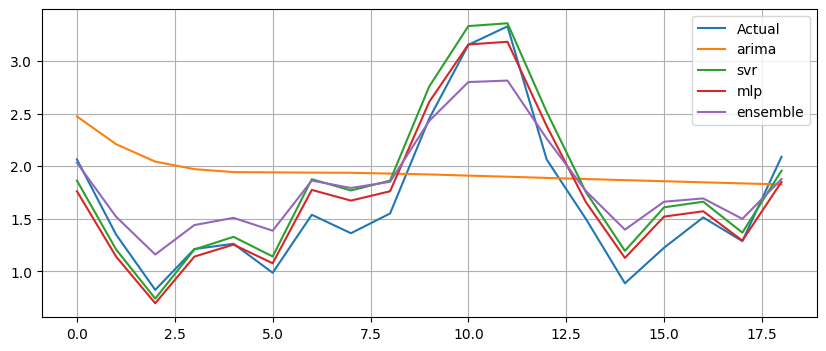

Generation 12: Fitness = 2.62024




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.24424289596991
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078196284143
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078192383783
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078192490729
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244063765493359
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2398604694394344
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440738576637358
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440738576637358
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440227172597247
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2440738573083563
SVRModel {'kernel': 'linear', 'c': 54.17536572004872, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.662463583217661
SVRModel {'kernel': 'linear', 'c': 51.4497954880406, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680704554597434
SVRModel {'kernel': 'linear', 'c': 54.32685451077708, 'gamma': 'scale', 'epsilon': 0.4087441290120407} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


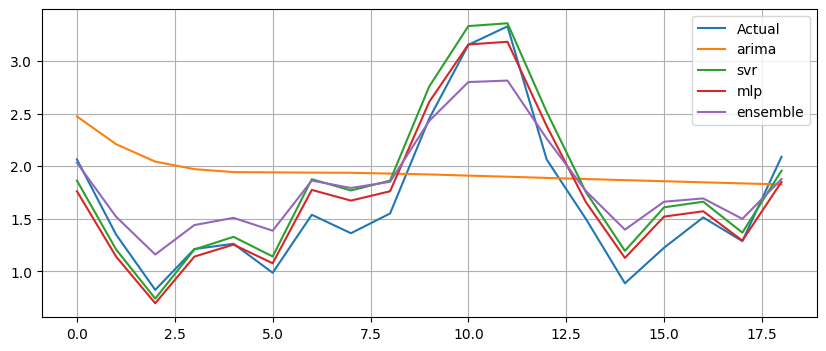

Generation 13: Fitness = 2.62024




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442316406637561
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682251045389236
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078189167645
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2511024232453174
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2441074947250472
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078192454518
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2513954228252664
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078192446806
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2441560433874552
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 1.0657164565280093
SVRModel {'kernel': 'linear', 'c': 54.0765276391453, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.667966898205033
SVRModel {'kernel': 'linear', 'c': 54.0765276391453, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500881459951455
SVRModel {'kernel': 'linear', 'c': 56.693089000852964, 'gamma': 'scale', 'epsilon': 0.4087441290120407

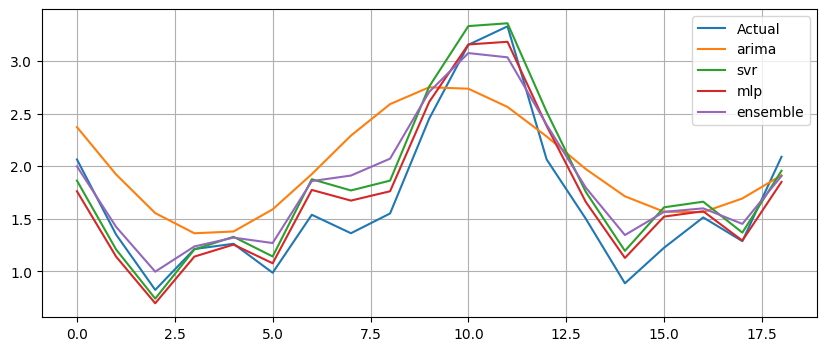

Generation 14: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078196221116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816499769779794
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244207819431923
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2339435079913215
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078191023378
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2454478200261736
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078192721442
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.155485170169981
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.9354710493806104
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442166959957186
SVRModel {'kernel': 'linear', 'c': 51.4988860628726, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680704594492166
SVRModel {'kernel': 'linear', 'c': 51.4988860628726, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.649844882790777
SVRModel {'kernel': 'linear', 'c': 52.897800781256734, 'gamma': 'scale', 'epsilon': 0.4087441290120407}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


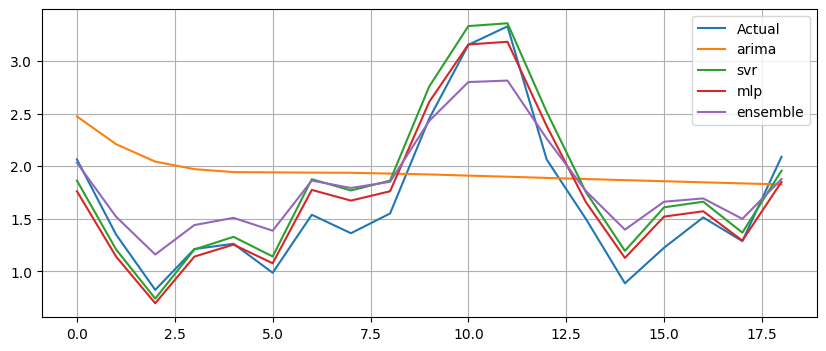

Generation 15: Fitness = 2.62024




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078196221116
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2473851574583692
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078191165948
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.096432607796136
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078192721442
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.25109889919034
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518570198
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518570198
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2326443930628774
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2401287767613014
SVRModel {'kernel': 'linear', 'c': 51.4988860628726, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6680704594492166
SVRModel {'kernel': 'linear', 'c': 54.0765276391453, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.670949646152242
SVRModel {'kernel': 'linear', 'c': 55.22113636915183, 'gamma': 'scale', 'epsilon': 0.4087441290120407} F

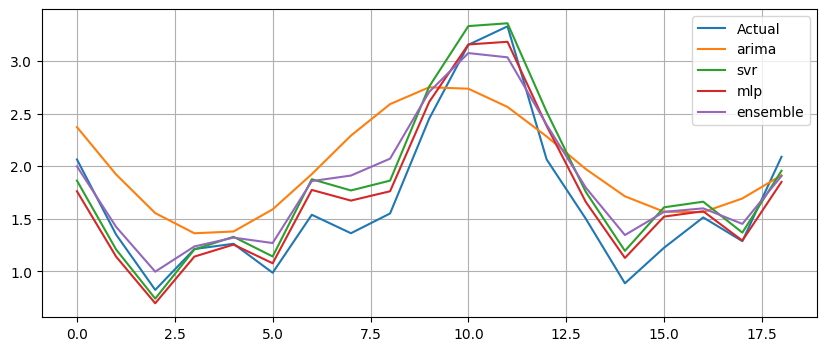

Generation 16: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518570198
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518913157
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822159714940124
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.244207819705886
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815113194180171
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078192721442
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8601264362266761
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518977035
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0900616271588424
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518837053
SVRModel {'kernel': 'linear', 'c': 54.0765276391453, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500833122917293
SVRModel {'kernel': 'linear', 'c': 55.32607874428855, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500834186412603
SVRModel {'kernel': 'linear', 'c': 55.22113636915183, 'gamma': 'scale', 'epsilon': 0.402587574226823

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


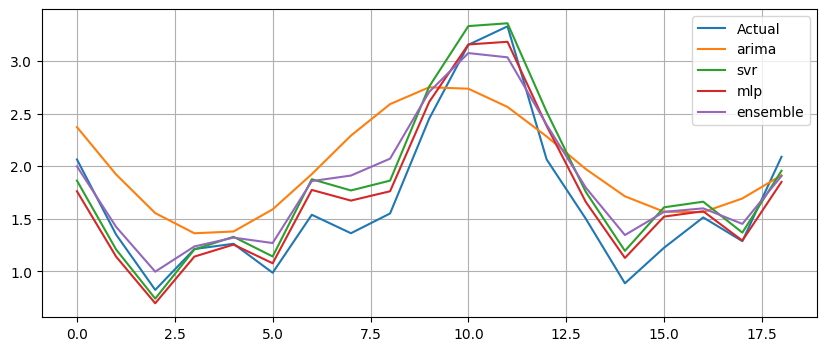

Generation 17: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1732026264583815
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518142036
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518831682
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518865217
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518913157
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811783650197978
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851769324
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518935537
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0967961076414405
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188519235308
SVRModel {'kernel': 'linear', 'c': 55.407914413457306, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6714278688549764
SVRModel {'kernel': 'linear', 'c': 52.516379718318355, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.650083179549285
SVRModel {'kernel': 'linear', 'c': 55.02964414566988, 'gamma': 'scale', 'epsilon': 0.4087441290120

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


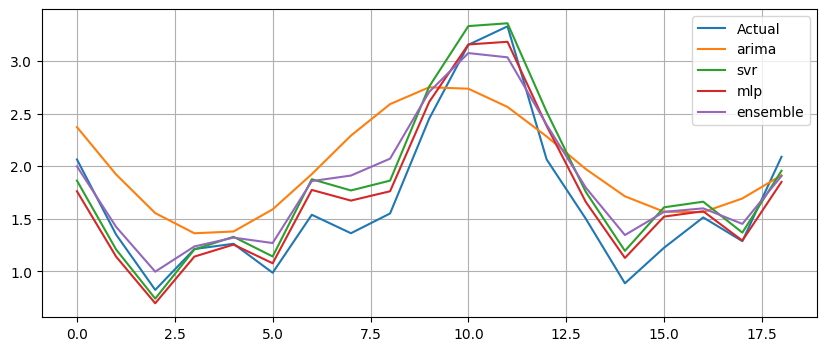

Generation 18: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518767125
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0967961077607247
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518709682
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6834670585471028
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851683571
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518635592
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188519104042
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188519044288
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.155485170262795
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518935537
SVRModel {'kernel': 'linear', 'c': 54.79371198110961, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.65008337341543
SVRModel {'kernel': 'linear', 'c': 51.89038974905339, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.678758122114947
SVRModel {'kernel': 'linear', 'c': 54.58497285105434, 'gamma': 'scale', 'epsilon': 0.4087441290120407} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


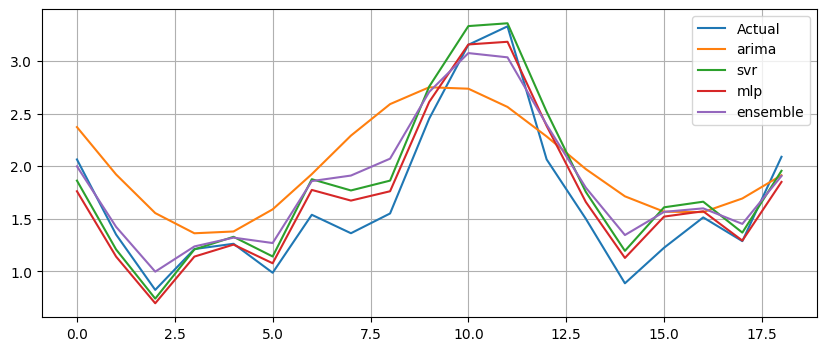

Generation 19: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851908249
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188519065748
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188517970225
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681778865961177
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2442078191278014
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518472147
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686563264858222
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851890199
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188517970225
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821592765896747
SVRModel {'kernel': 'linear', 'c': 55.943661524294996, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500834710349466
SVRModel {'kernel': 'linear', 'c': 55.882943074171976, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.650083465789907
SVRModel {'kernel': 'linear', 'c': 51.89038974905339, 'gamma': 'scale', 'epsilon': 0.4087441290120407

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


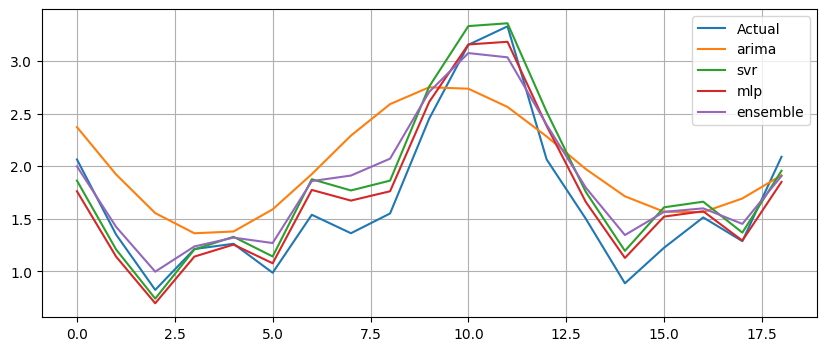

Generation 20: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68231885188619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68231885188619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2675635450653697
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851800386
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8601264419157421
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851800386
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68231885188619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818999772583973
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318852026709
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1508253732920681
SVRModel {'kernel': 'linear', 'c': 55.1395334569055, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.650083402708764
SVRModel {'kernel': 'linear', 'c': 55.1395334569055, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.650083402708764
SVRModel {'kernel': 'poly', 'c': 55.882943074171976, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


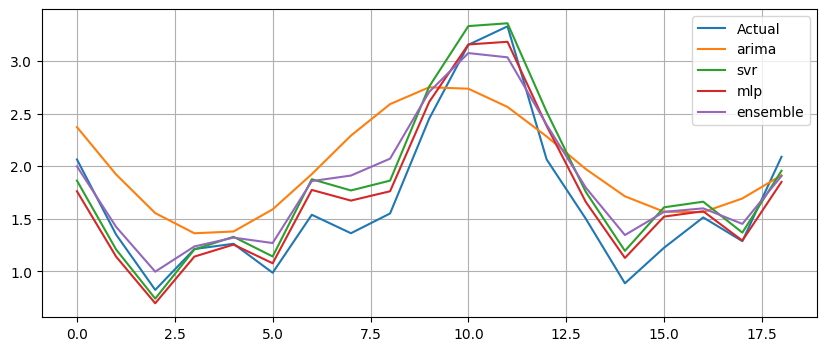

Generation 21: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851800386
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6841301024793855
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820968414204986
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0933387983620555
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682187333824495
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518788028
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6797293551413874
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68231885188619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6834670586515088
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188519686603
SVRModel {'kernel': 'linear', 'c': 52.01232741593359, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500831368167344
SVRModel {'kernel': 'linear', 'c': 52.80947825438644, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6540816457305416
SVRModel {'kernel': 'linear', 'c': 60.26034286536008, 'gamma': 'scale', 'epsilon': 0.4087441290120407}

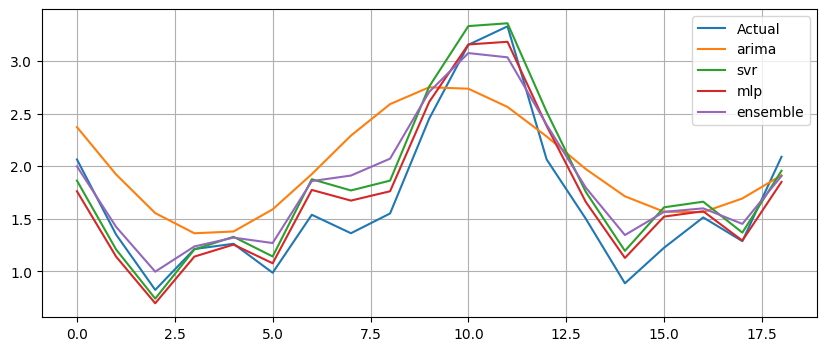

Generation 22: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851973387
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815047143674315
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823117820873303
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518094239
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68231885188619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318852026709
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6796068919473672
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.680690833332202
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686583681643747
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518628307
SVRModel {'kernel': 'linear', 'c': 58.31785570160518, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.65008367285366
SVRModel {'kernel': 'linear', 'c': 60.08788740331759, 'gamma': 'scale', 'epsilon': 0.3032759196007423} Fitness: 3.163000651938478
SVRModel {'kernel': 'linear', 'c': 52.47954318733814, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitn

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


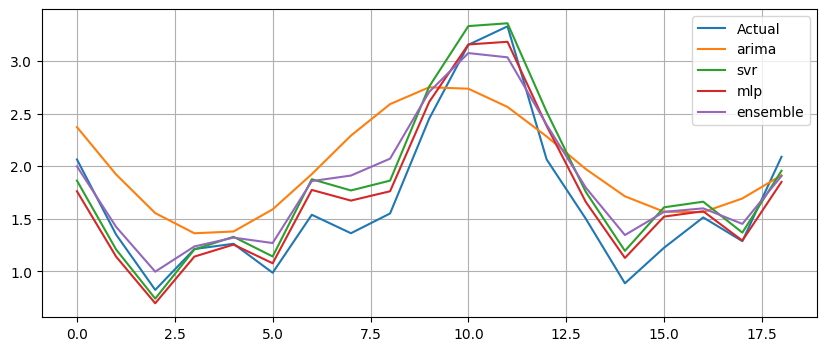

Generation 23: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68231885188619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518237542
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818179879029502
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823183476071089
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318852026709
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318851800386
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6827124197136543
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6870846750419537
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.155485170085486
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682603107030419
SVRModel {'kernel': 'linear', 'c': 55.1395334569055, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.650083402708764
SVRModel {'kernel': 'linear', 'c': 52.863778470299216, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500832092717572
SVRModel {'kernel': 'linear', 'c': 60.26034286536008, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fi

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


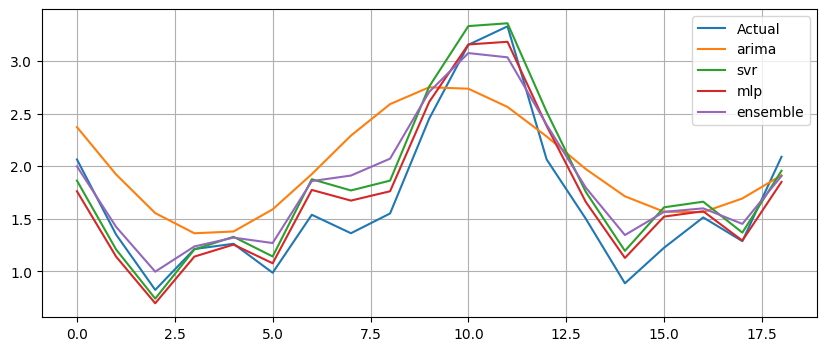

Generation 24: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518237542
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518237542
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821947674204485
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681588853712534
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6864298097485322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518237542
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821415396760924
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682603107030419
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6785935722327812
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2441633457887311
SVRModel {'kernel': 'linear', 'c': 52.863778470299216, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500832092717572
SVRModel {'kernel': 'linear', 'c': 52.863778470299216, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500832092717572
SVRModel {'kernel': 'linear', 'c': 52.863778470299216, 'gamma': 'scale', 'epsilon': 0.408744129012

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


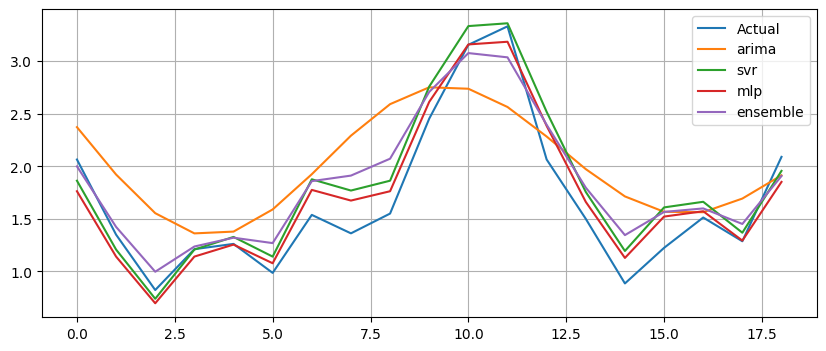

Generation 25: Fitness = 2.82721




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821947674679494
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518387002
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518237542
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.676189994482397
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1819445282715058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823065529250794
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1487105066663175
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68158885377497
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2675714248174765
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821349028467538
SVRModel {'kernel': 'linear', 'c': 54.59476949357632, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.649983097022918
SVRModel {'kernel': 'linear', 'c': 53.4085424336284, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500832555801694
SVRModel {'kernel': 'linear', 'c': 52.863778470299216, 'gamma': 'scale', 'epsilon': 0.4087441290120407}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


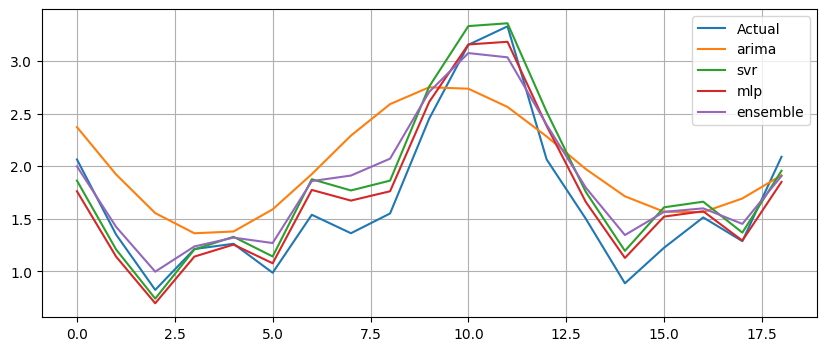

Generation 26: Fitness = 2.82967




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823180388779337
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819709990473268
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818902111340401
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811771157963706
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518519259
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819787326807596
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821947674828843
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68231885188619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682012543215594
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819845200363905
SVRModel {'kernel': 'linear', 'c': 53.43898102536227, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6416242068665996
SVRModel {'kernel': 'linear', 'c': 54.564330901842446, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6498465767552073
SVRModel {'kernel': 'linear', 'c': 55.1395334569055, 'gamma': 'scale', 'epsilon': 0.4087441290120407

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


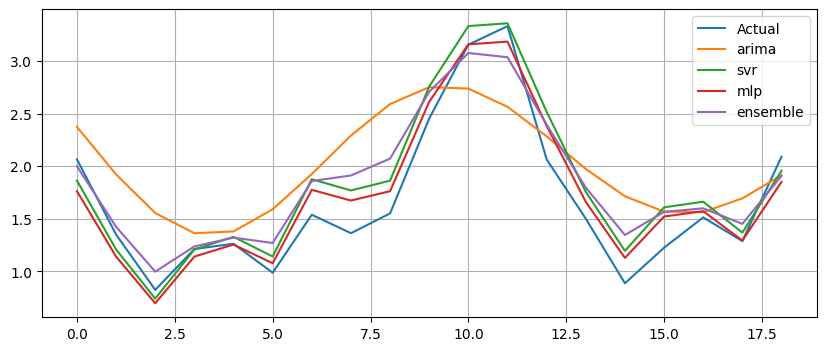

Generation 27: Fitness = 2.83082




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518544148
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188519271957
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682318929292063
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682194767733725
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823196524126622
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682111959937961
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825483187999835
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68231885188619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823196524126622
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518967707
SVRModel {'kernel': 'linear', 'c': 53.98172775725387, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.65008330419212
SVRModel {'kernel': 'linear', 'c': 56.63347703923644, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.65008352987911
SVRModel {'kernel': 'linear', 'c': 55.74867138402953, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitn

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


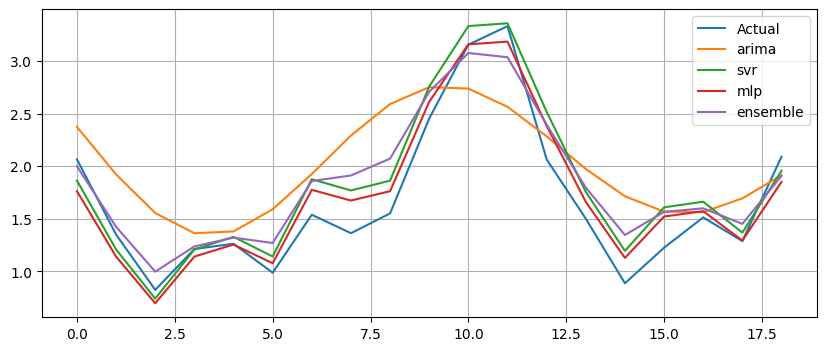

Generation 28: Fitness = 2.83082




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681226583563478
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188519098102
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188518544148
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823196524126622
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821083383212967
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1732026263292796
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1518735313207331
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823196524126622
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823196524126622
SVRModel {'kernel': 'linear', 'c': 56.248920953566284, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.651055717863996
SVRModel {'kernel': 'linear', 'c': 56.00053298827098, 'gamma': 'scale', 'epsilon': 0.4087441290120407} Fitness: 3.6500834758770537
SVRModel {'kernel': 'linear', 'c': 53.98172775725387, 'gamma': 'scale', 'epsilon': 0.40874412901204

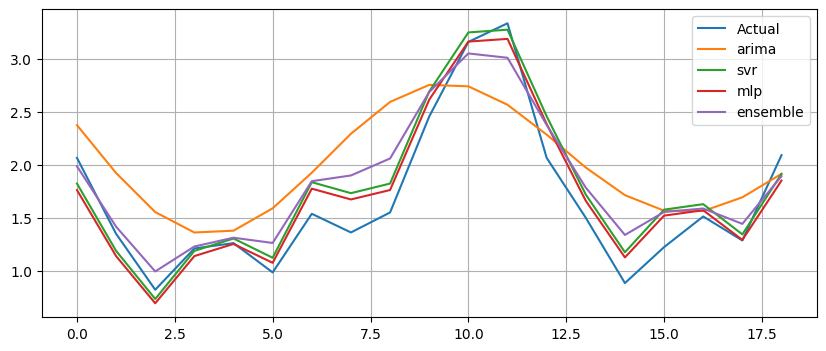

Generation 29: Fitness = 2.88399




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823348366448712
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819160563853626
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823196524126622
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823196524126622
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6761849342984259
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811607647445685
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823188519340522
SVRModel {'kernel': 'linear', 'c': 64.19308954225066, 'gamma': 'scale', 'epsilon': 0.4148100030959223} Fitness: 3.7657802370809828
SVRModel {'kernel': 'linear', 'c': 57.39194802515882, 'gamma': 'scale', 'epsilon': 0.4199368848115408} Fitness: 3.9019257965276264
SVRModel {'kernel': 'linear', 'c': 56.724618802476876, 'gamma': 'scale', 'epsilon': 0.408744129012

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


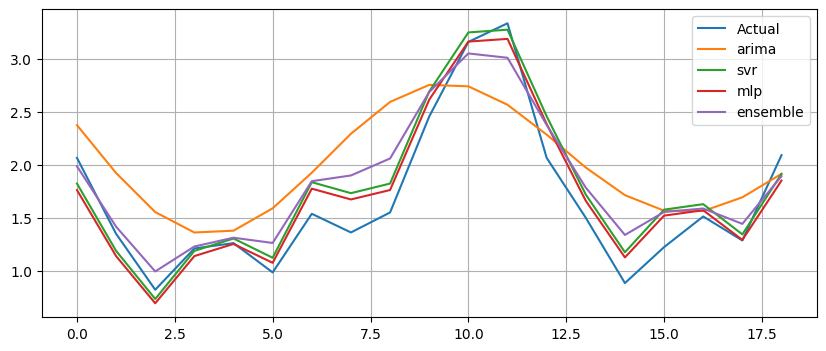

Generation 30: Fitness = 2.88399




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681151034876286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682357945397511
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823159091752704
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6796018318492
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1554541819690451
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.684123765981324
SVRModel {'kernel': 'linear', 'c': 56.724618802476876, 'gamma': 'scale', 'epsilon': 0.4260027588954224} Fitness: 4.060310248167944
SVRModel {'kernel': 'linear', 'c': 56.724618802476876, 'gamma': 'scale', 'epsilon': 0.4260027588954224} Fitness: 4.062413832614181
SVRModel {'kernel': 'linear', 'c': 56.724618802476876, 'gamma': 'scale', 'epsilon': 0.4260027588954224} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


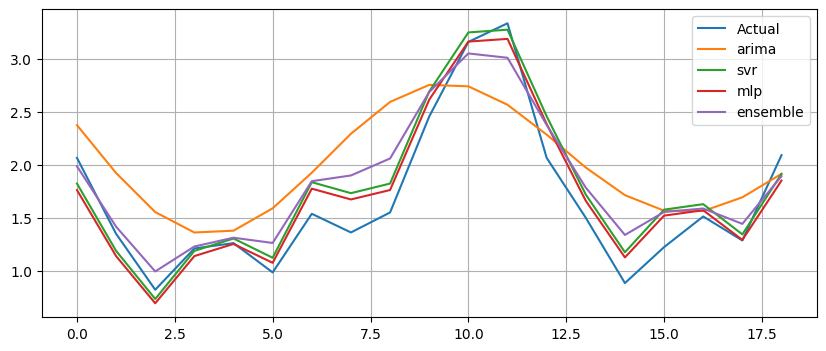

Generation 31: Fitness = 2.88399




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820018565160841
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6876733810047049
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812832157839854
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2792200704539356
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821402053346064
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6876733810047049
SVRModel {'kernel': 'linear', 'c': 41.27139432572037, 'gamma': 'scale', 'epsilon': 0.4260027588954224} Fitness: 4.060230466283415
SVRModel {'kernel': 'linear', 'c': 51.3753952023864, 'gamma': 'scale', 'epsilon': 0.4260027588954224} Fitness: 4.060310248167944
SVRModel {'kernel': 'linear', 'c': 56.91646344515194, 'gamma': 'scale', 'epsilon': 0.4260027588954224

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


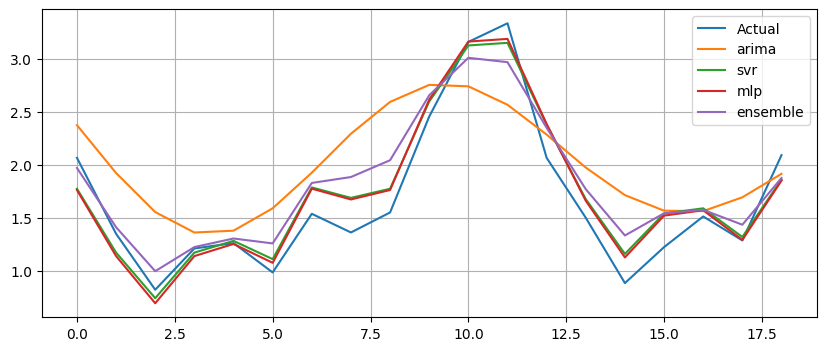

Generation 32: Fitness = 2.93303




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2748906427375024
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1691113263521231
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1554541819690451
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811450422930996
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1554541819690451
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
SVRModel {'kernel': 'poly', 'c': 56.724618802476876, 'gamma': 'scale', 'epsilon': 0.4260027588954224} Fitness: 1.4125840174103215
SVRModel {'kernel': 'linear', 'c': 56.724618802476876, 'gamma': 'scale', 'epsilon': 0.4260027588954224} Fitness: 4.060310248167944
SVRModel {'kernel': 'linear', 'c': 56.724618802476876, 'gamma': 'scale', 'epsilon': 0.4260027588954

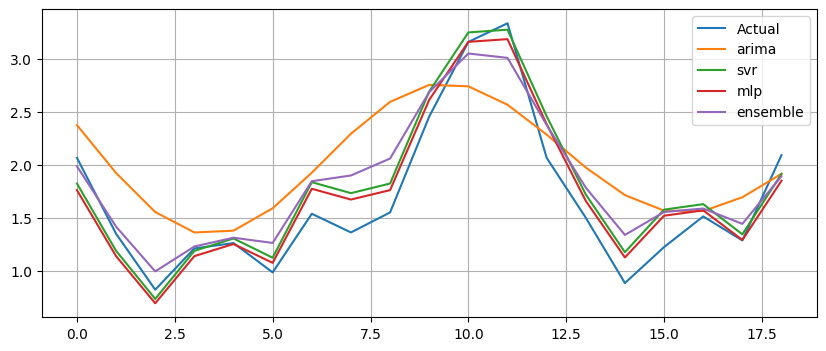

Generation 33: Fitness = 2.88593




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823449932547598
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6846382508046
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823317483157687
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823317483157687
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823317483157687
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.48985679718957176} Fitness: 4.5143995587066845
SVRModel {'kernel': 'linear', 'c': 56.76521813176875, 'gamma': 'scale', 'epsilon': 0.4260027588954224} Fitness: 4.070937744872996
SVRModel {'kernel': 'linear', 'c': 56.904745659942535, 'gamma': 'scale', 'epsilon': 0.42600275889542

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


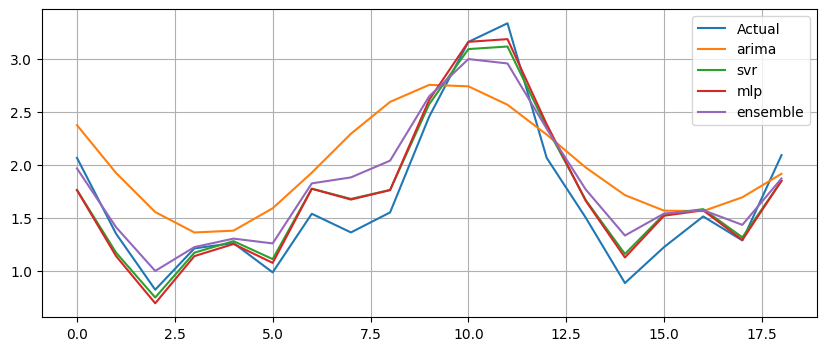

Generation 34: Fitness = 2.94034




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823317483157687
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1555153590665652
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.089640153262196
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820920251390712
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686567820271442
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823317483157687
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6800182693650099
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823317483157687
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.15547817088429
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
SVRModel {'kernel': 'linear', 'c': 51.95880099295089, 'gamma': 'scale', 'epsilon': 0.4260027588954224} Fitness: 4.0603185111240085
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4401632162008027} Fitness: 4.389700046154602
SVRModel {'kernel': 'linear', 'c': 63.198797508218476, 'gamma': 'scale', 'epsilon': 0.4260027588954224

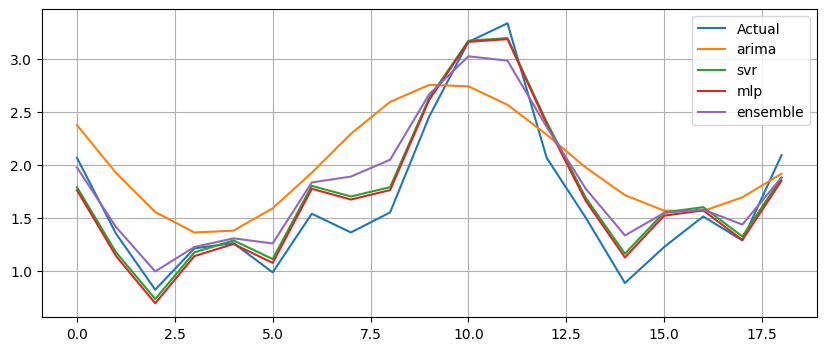

Generation 35: Fitness = 2.92618




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682440110189855
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824175540977442
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823083924575255
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0957792770875112
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.150827278430585
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824232875202614
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1639911082465673
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824232875202614
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823317483157687
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823137917022188
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4401632162008027} Fitness: 4.370962345124309
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4401632162008027} Fitness: 4.370958896550463
SVRModel {'kernel': 'linear', 'c': 51.95880099295089, 'gamma': 'scale', 'epsilon': 0.426002758895422

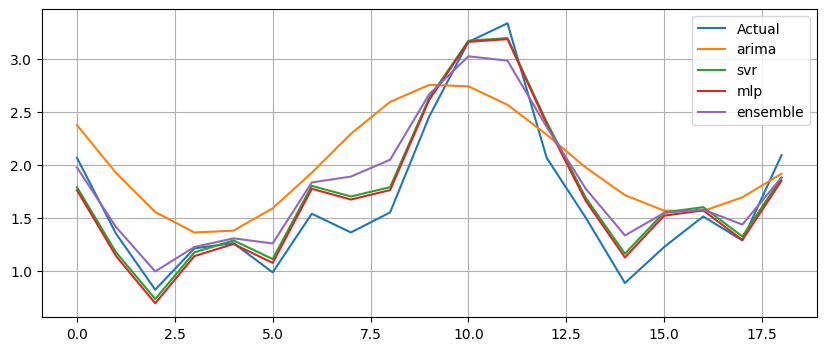

Generation 36: Fitness = 2.92618




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.688197570864067
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6801277651830526
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682439507064942
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824179363258456
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823621089023462
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824406089863768
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822609392071404
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0892470879144411
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824412441338115
SVRModel {'kernel': 'rbf', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4401632162008027} Fitness: 1.5009395574083906
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4401632162008027} Fitness: 4.372728278729446
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49643303056227606

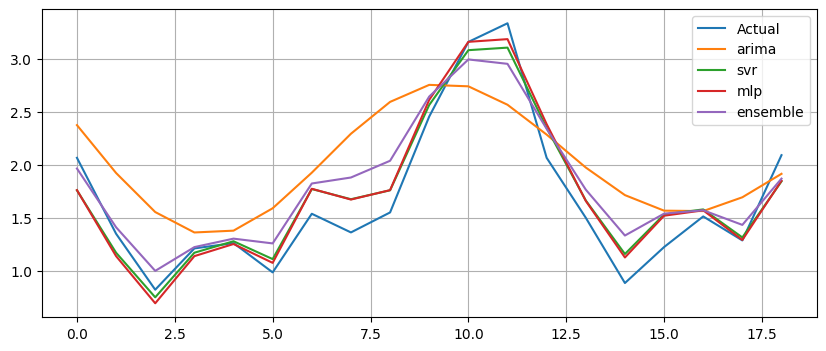

Generation 37: Fitness = 2.94187




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813882204153405
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823715163054047
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823633586081672
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682421319611081
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1554863424097317
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823610285086994
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824412441338115
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824412441338115
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6824412441338115
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682189699168283
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.45951977142450756} Fitness: 4.443593242905898
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4770764753385711} Fitness: 4.488911712512806
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4887896746347

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


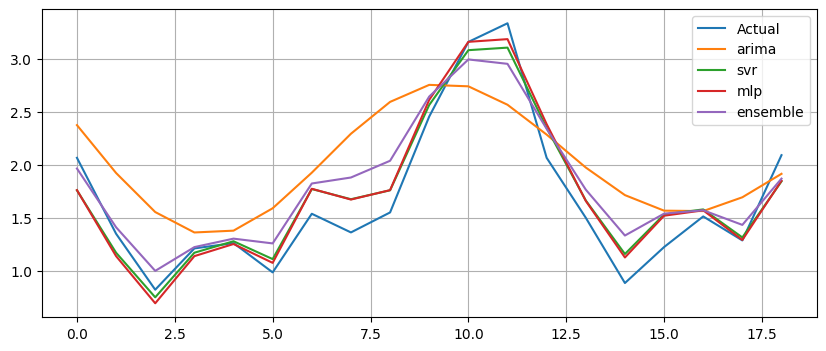

Generation 38: Fitness = 2.94187




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823960341611437
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1538714453948338
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6806859884563792
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811829896820698
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823963461524511
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823715163054047
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823633586081672
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550362163490795
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4596892703709778} Fitness: 4.441071231324342
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.476906976392101} Fitness: 4.514109907129055
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.488789674634720

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


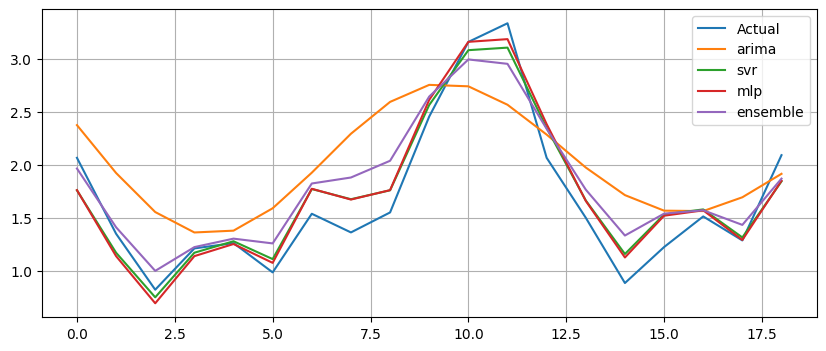

Generation 39: Fitness = 2.94187




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823359254311168
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821905264998966
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823633586081672
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1675380681580196
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4272134466269853} Fitness: 4.091098820404599
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49643303056227606} Fitness: 4.5241619127629065
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4887896746347209

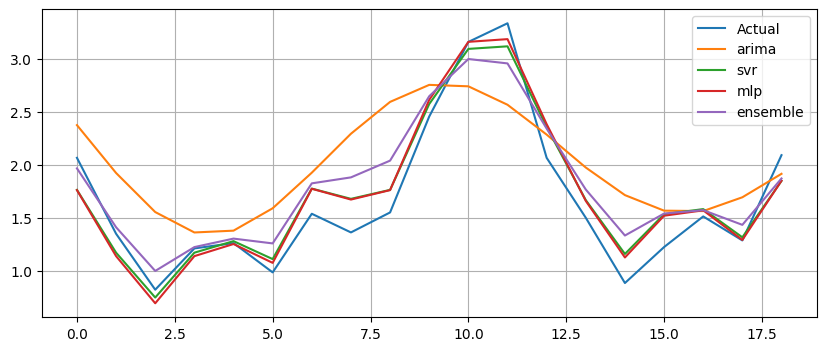

Generation 40: Fitness = 2.94009




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823384369341259
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823633586081672
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823633586081672
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673955266284337
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.088573115532759
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.42780775776929925} Fitness: 4.1060777304352944
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49643303056227606} Fitness: 4.524141163643756
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.488789674634720

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


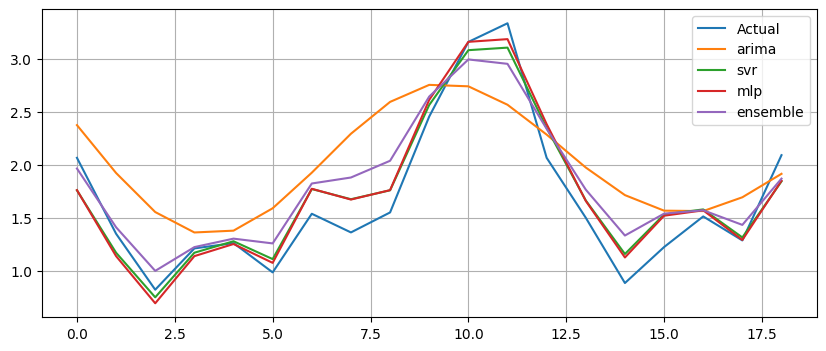

Generation 41: Fitness = 2.94187




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823633586081672
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823633586081672
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0936098937242977
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8391457891610272
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823620800670973
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49643303056227606} Fitness: 4.524141163643756
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4887896746347209} Fitness: 4.512598171250034
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4887896746347209

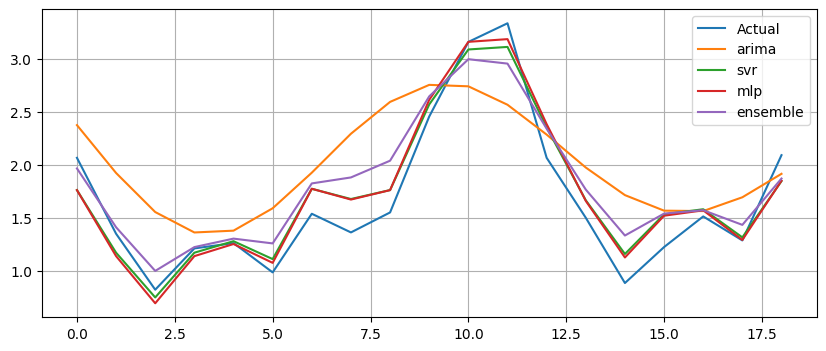

Generation 42: Fitness = 2.94091




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6867856022802763
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682362231565976
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678594022270916
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682362231565976
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823960607573412
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682887123045504
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682362231565976
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49643303056227606} Fitness: 4.537794967307482
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4922697618539178} Fitness: 4.518243864330523
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49643303056227606} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


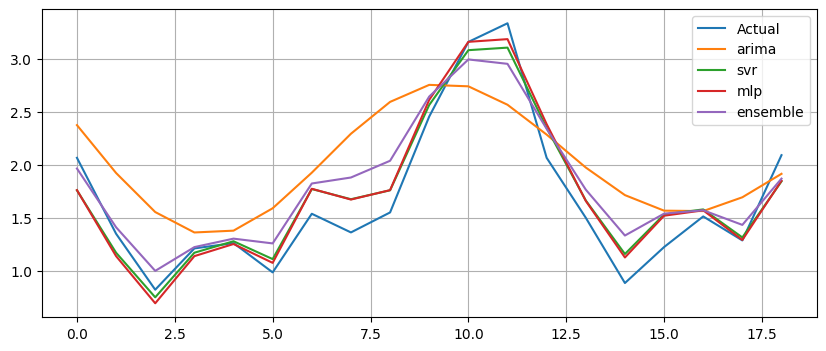

Generation 43: Fitness = 2.94187




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111578108687076
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823617515717917
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6904441903890322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823616570787547
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618223406778
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6835621783918084
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6904075935885885
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361663656134
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'poly', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1427927298593026
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49915102245044096} Fitness: 4.5274826486335655

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


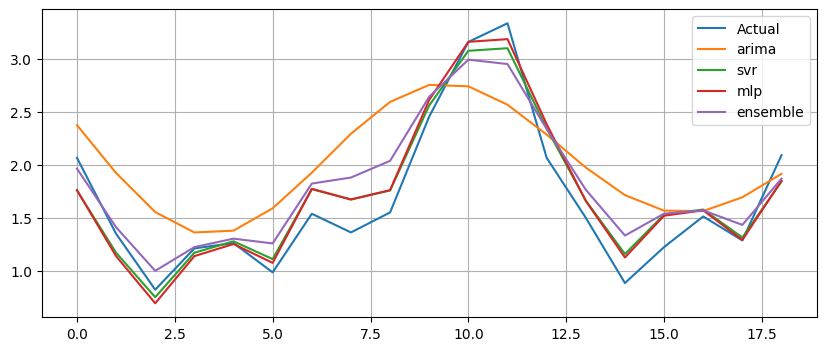

Generation 44: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823617865357208
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361782681811
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821790993960881
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.081337662251834
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823616945727675
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823616691686587
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49947774503321957} Fitness: 4.527857102135288
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.49944399772197523} Fitness: 4.5278186958394855
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness:

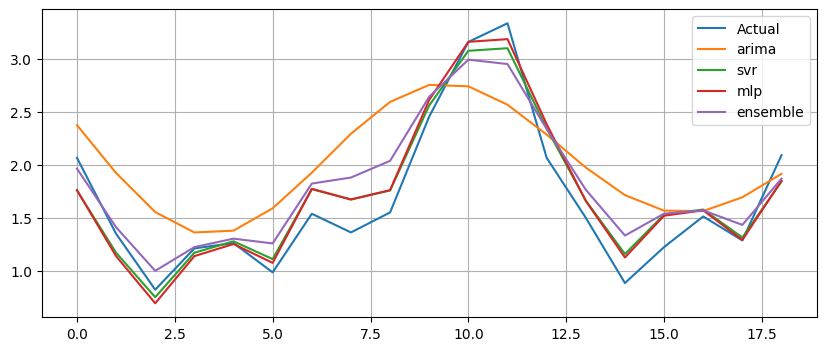

Generation 45: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618476591644
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682361791220103
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6905575183962291
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6776361275953997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4999596232528657} Fitness: 4.528398687420039
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4995181217803539} Fitness: 4.527902970988445
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


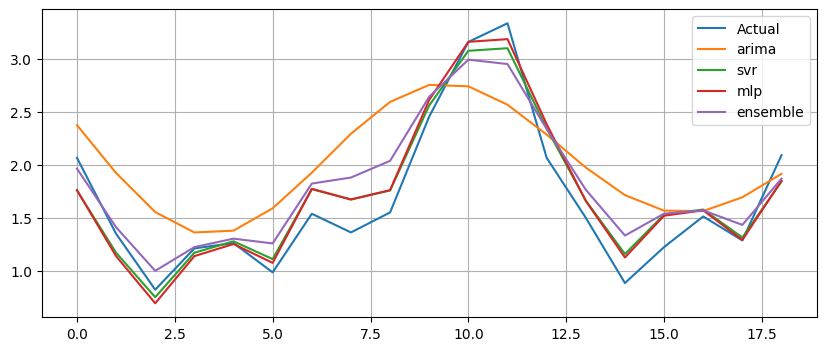

Generation 46: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8382969854081976
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813537275607433
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6905575183962291
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.073313769092255
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6800483743470953
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 64.43093343203653, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.67432782330905
SVRModel {'kern

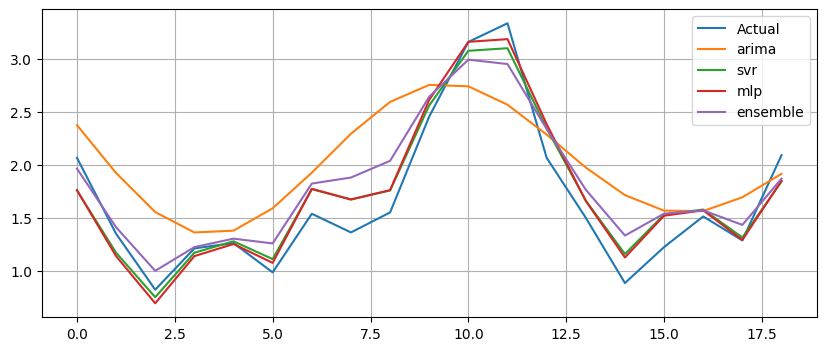

Generation 47: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1705792264949941
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'k

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


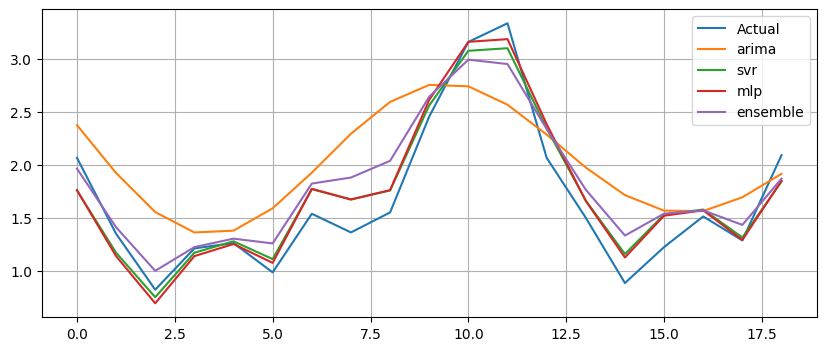

Generation 48: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.073313769092255
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0730817090581475
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555492770493605
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546756108069892
SVRModel {'ke

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


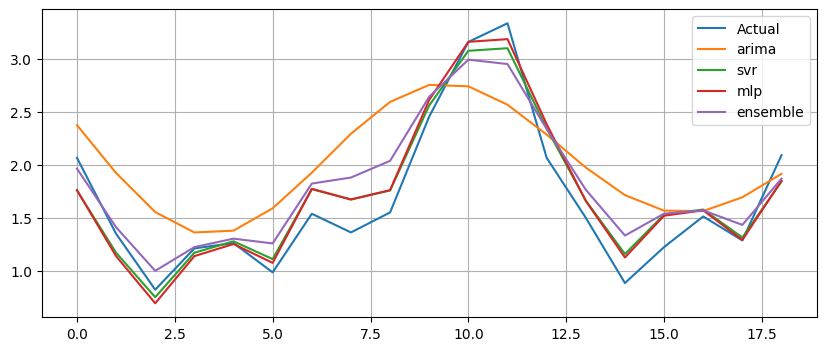

Generation 49: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1705792264949941
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823692115881033
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681588568090696
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546756108069892
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547138133600447
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'ke

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


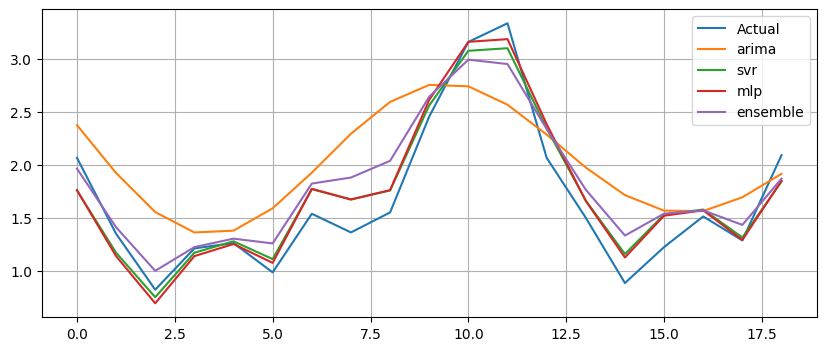

Generation 50: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111578108687076
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111578108687076
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821930852356806
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811889920408747
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'ker

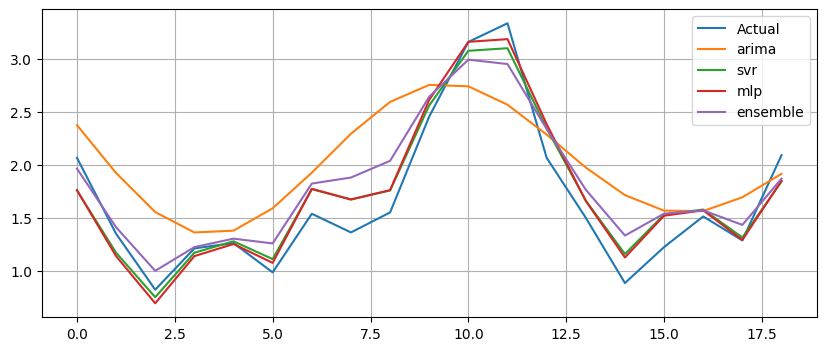

Generation 51: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681588568090696
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6809046498541418
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9106568828952235
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686873554822103
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.535199029053748
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'ker

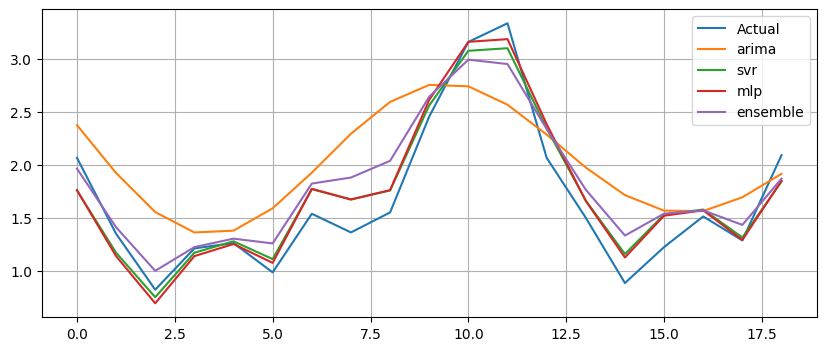

Generation 52: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2410010818011052
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0741014697892741
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.543205810174301
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'k

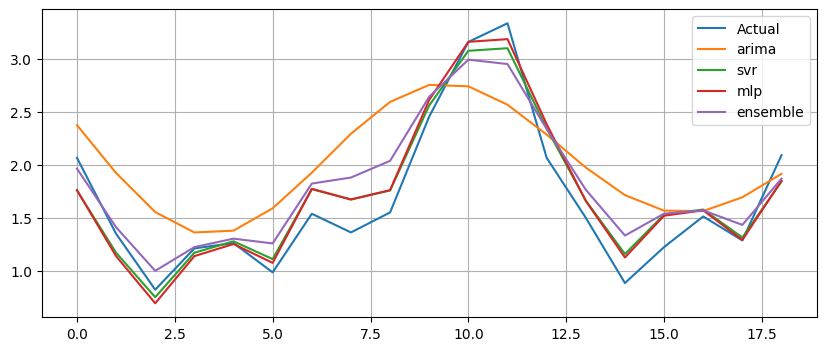

Generation 53: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1547742075438134
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2366055728272802
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2410010818011052
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6842590956075345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.553603324416709
SVRModel {'k

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


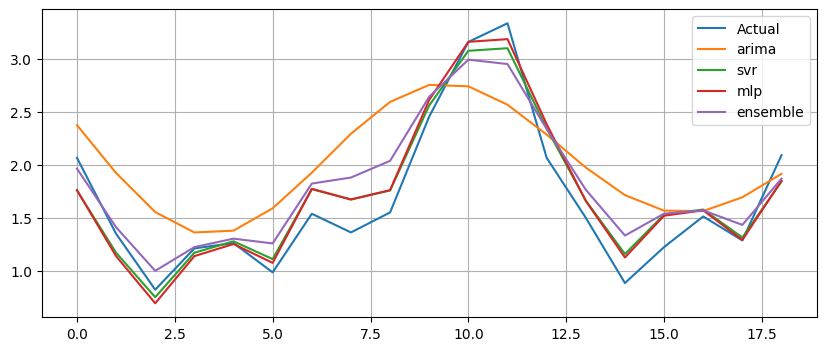

Generation 54: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6827801134476075
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679292757306224
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813537275607433
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678594211912636
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.537085059305957
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.540733726934335
SVRModel {'ker

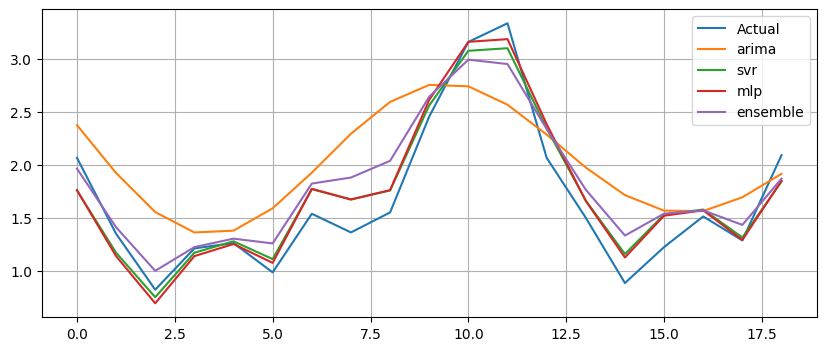

Generation 55: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816291733013637
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.680684483146066
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6830301870552271
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821611594596753
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.4563408623552908} Fitness: 4.43606249825317

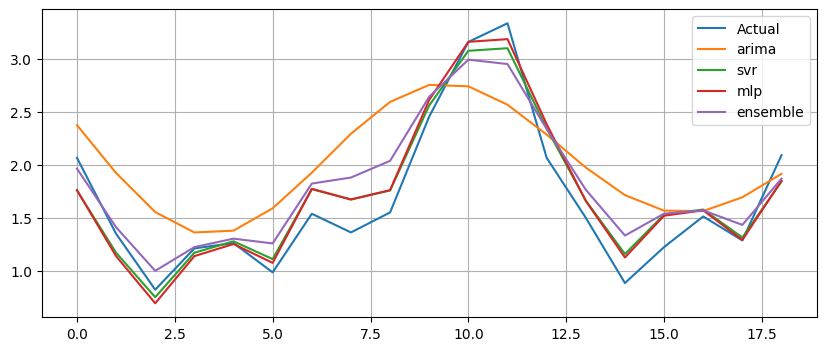

Generation 56: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823647064961602
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819508132057857
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821726495836025
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546756108069892
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'k

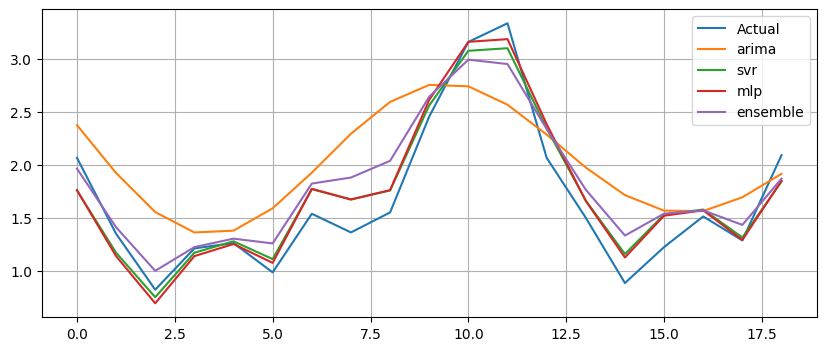

Generation 57: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822064940064483
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8382969854081976
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821822314143529
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528450273174846
SVRModel {'kernel': 'linear', 'c': 58.12110150814602, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'ke

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


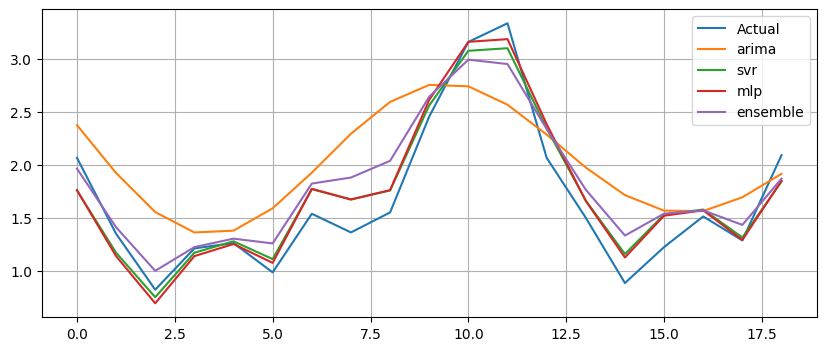

Generation 58: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822012012461711
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812386214170556
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6800483743470953
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678594211912636
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822067162986543
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 48.93783216543307, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528450492079999
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.532683678742619
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.553603324416709
SVRModel {'ker

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


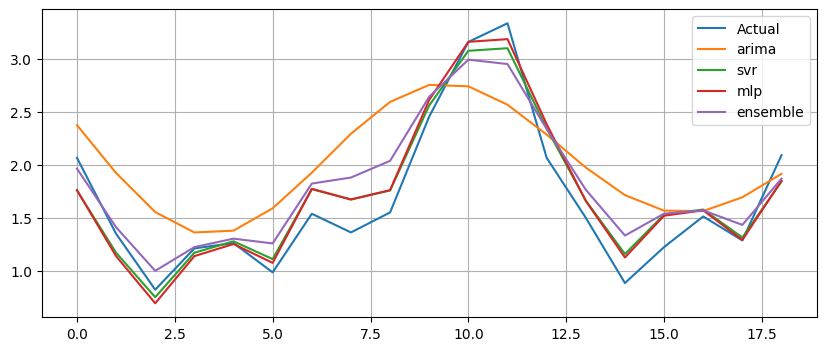

Generation 59: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817457514431697
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.536476395264903
SVRModel {'kernel': 'linear', 'c': 51.433085831470784, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'k

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


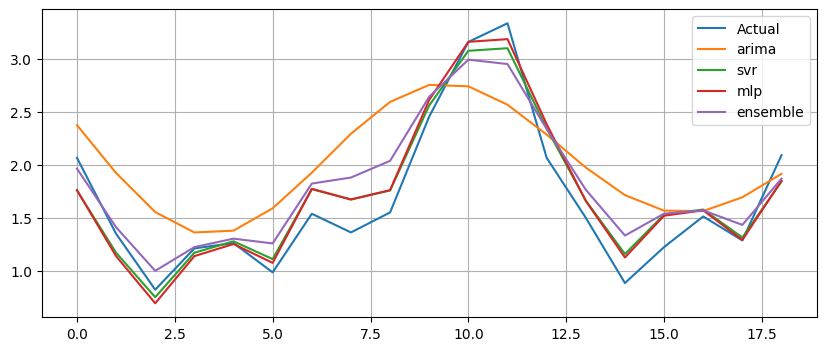

Generation 60: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6842590956075345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 48.93783216543307, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'ke

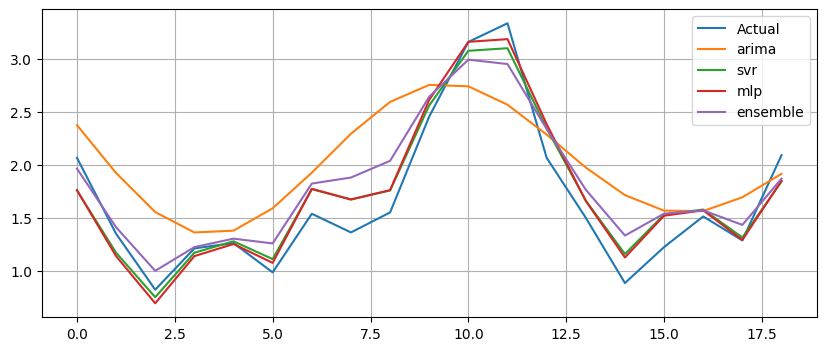

Generation 61: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2419199032817059
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 48.93783216543307, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'ke

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


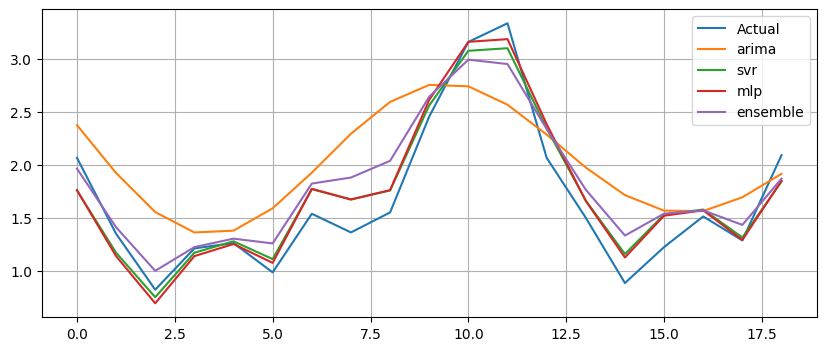

Generation 62: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682034034527862
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111622760799845
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6853701508794978
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.47972021900580836} Fitness: 4.494878057797569
SVRModel {'kernel': 'poly', 'c': 46.00451521997887, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.142861500146525
S

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


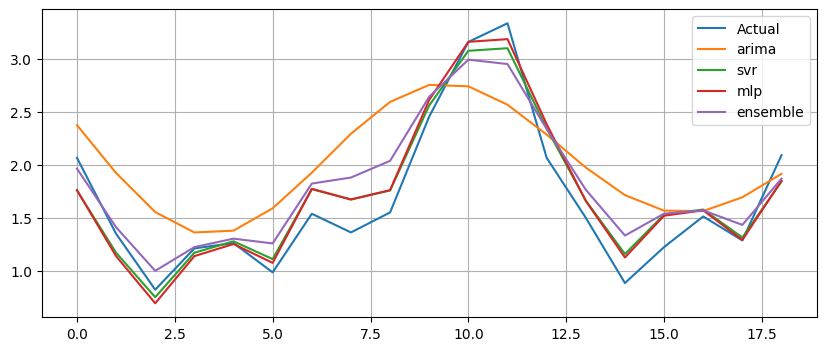

Generation 63: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1705792264949941
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6809046498541418
SVRModel {'kernel': 'linear', 'c': 57.29871182750824, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547138133600447
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547294853854201
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'ke

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


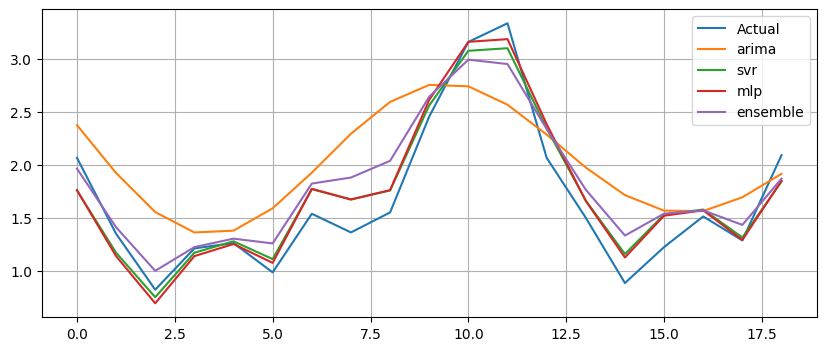

Generation 64: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6829737180362536
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6842666026905029
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546756108069892
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547294853854201
SVRModel {'k

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


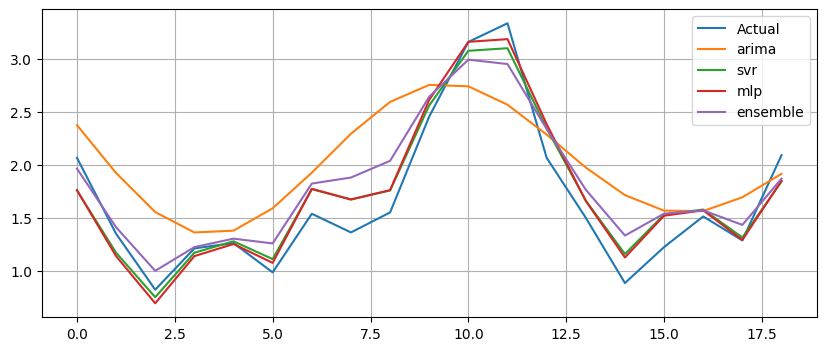

Generation 65: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811779089255794
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.240902258802979
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1705792264949941
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.864146330650655, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.53253245492721
SVRModel {'ker

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


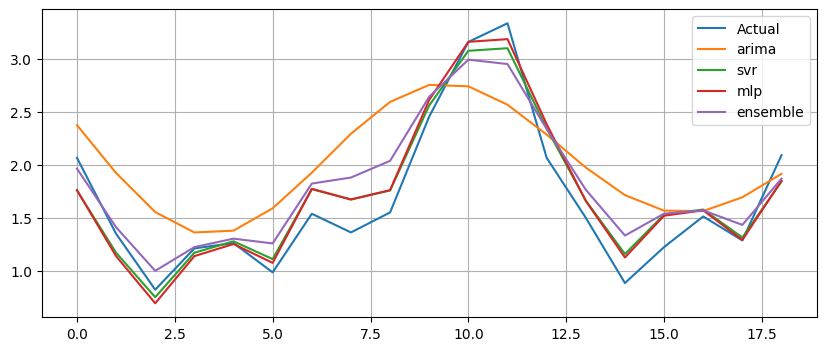

Generation 66: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811907468320437
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823617485835194
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6776361275953997
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0935293880845094
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.985673034455274, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.532548144023374
SVRModel {'kernel': 'linear', 'c': 56.98907825377664, 'gamma': 'scale', 'epsilon': 0.4951444937074566} Fitness: 4.522416301939618
SVRModel {'kernel': 'linear', 'c': 57.644837997659174, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.52844348812084

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


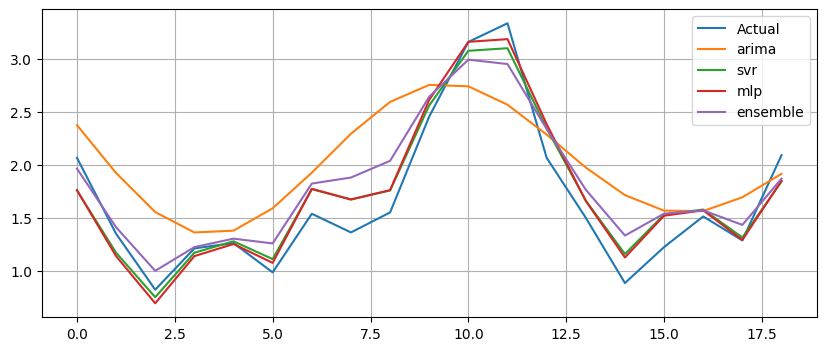

Generation 67: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682043811945217
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681179372096825
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6905575183962291
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 57.0268400002458, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528509980785479
SVRModel {'kernel': 'linear', 'c': 57.80759074458349, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 58.05588830225583, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel'

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


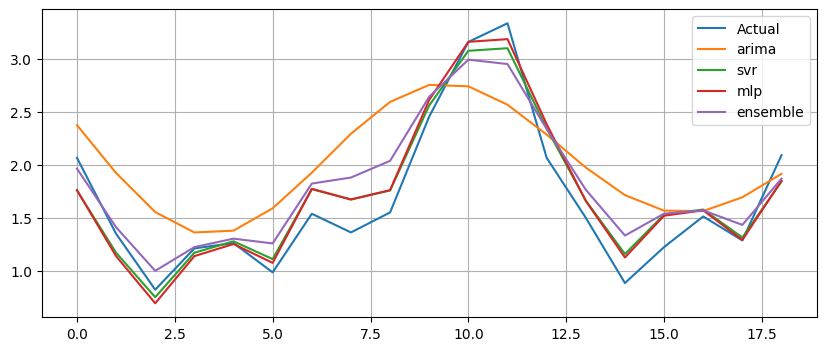

Generation 68: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1678701900901745
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1551544619967828
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 57.0268400002458, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.551374602305003
SVRModel {'kernel': 'linear', 'c': 56.985673034455274, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 60.61733908163978, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


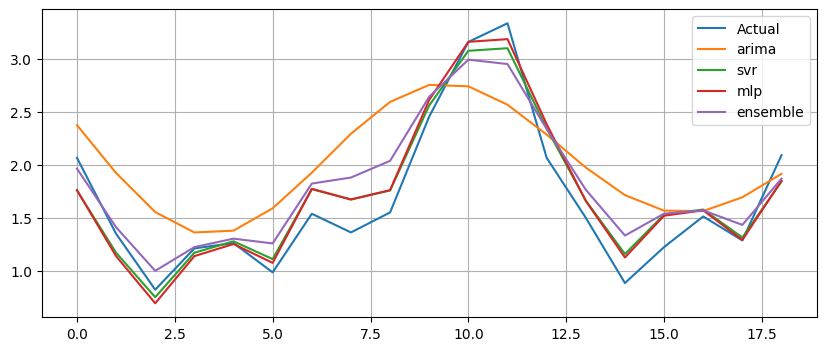

Generation 69: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.686281436720669
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
SVRModel {'kernel': 'poly', 'c': 57.02261053297435, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.2511899440317276
SVRModel {'kernel': 'linear', 'c': 56.989902501726725, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 60.61733908163978, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kerne

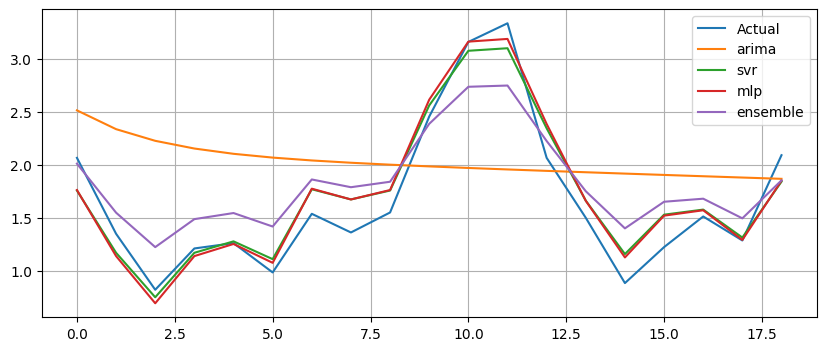

Generation 70: Fitness = 2.48392




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673284532185249
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673240456494072
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.690291896095536
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823616892694497
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111501843890013
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67909362448859
SVRModel {'kernel': 'linear', 'c': 56.1859336232853, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547294919493405
SVRModel {'kernel': 'linear', 'c': 60.30222346689295, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547297248541147
SVRModel {'kernel': 'linear', 'c': 56.1859336232853, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.553799623779814
SVRModel {'kernel': '

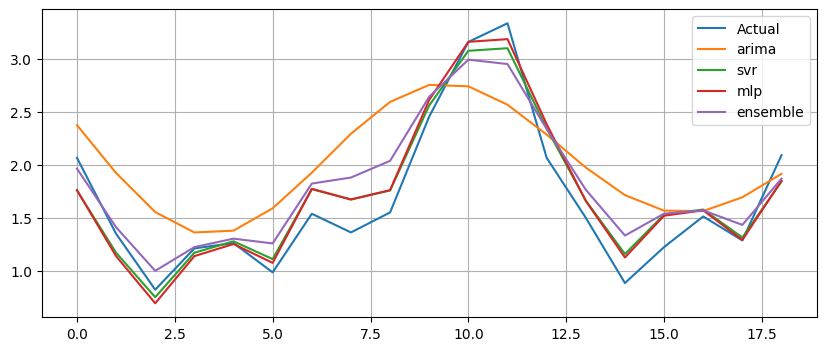

Generation 71: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0866246005039244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.683535160050028
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823357931019365
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.1859336232853, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546756108069892
SVRModel {'kernel': 'rbf', 'c': 56.1859336232853, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.5040034661558757
SVRModel {'kernel': 

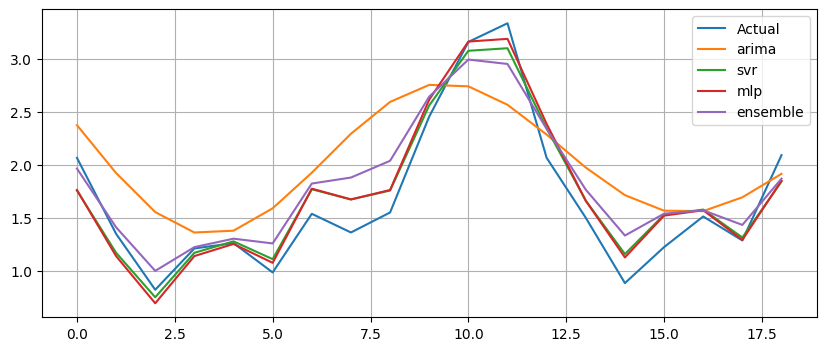

Generation 72: Fitness = 2.94078




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682339991430786
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681588568090696
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682339991430786
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.1859336232853, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284458828077945
SVRModel {'kernel': 'linear', 'c': 57.905428410405584, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.1859336232853, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel'

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


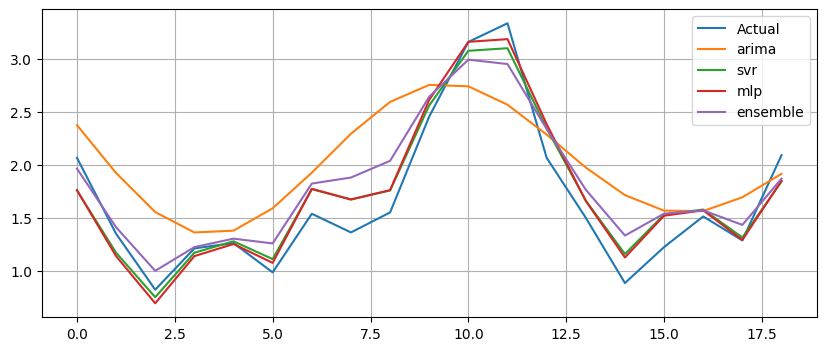

Generation 73: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819976129424217
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820200017102573
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682169680787065
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546756108069892
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528476674522194
SVRModel {'kernel': 'linear', 'c': 56.1859336232853, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


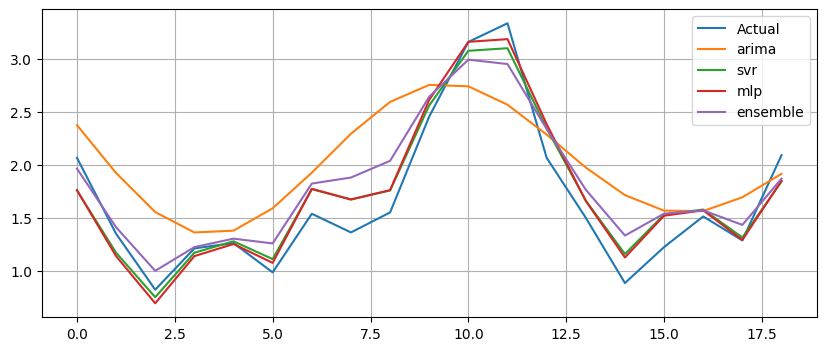

Generation 74: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.073313769092255
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6827801134476075
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823875449799397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555492770493605
SVRModel {'kernel': 'linear', 'c': 56.1859336232853, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


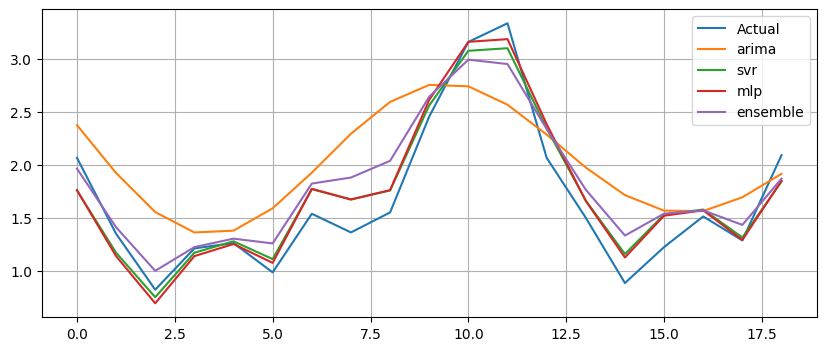

Generation 75: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681588568090696
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823439171016474
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 59.1112448756047, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


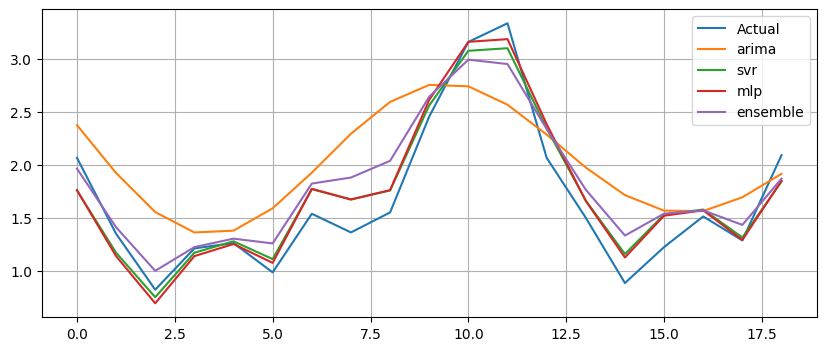

Generation 76: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1511839014030487
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0884120621230653
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0884120621230653
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6828889050522389
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6905575183962291
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555397679255001
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.553564661583414
SVRModel {'kern

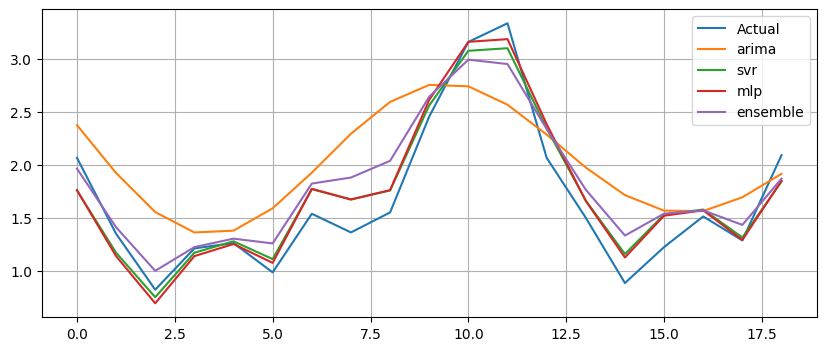

Generation 77: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6853701508794978
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6842666026905029
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6853701508794978
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.545160175039567
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kern

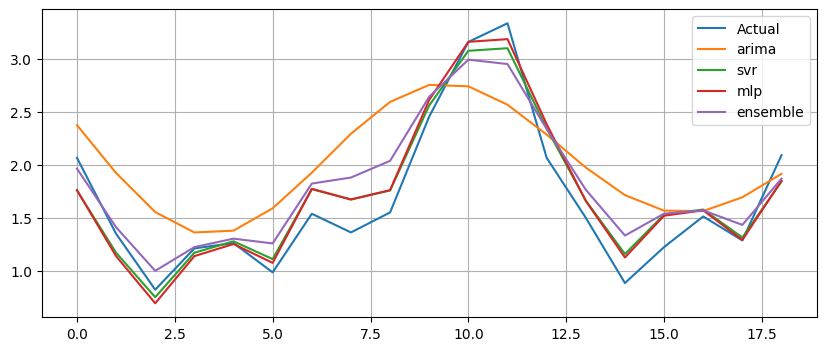

Generation 78: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823682651671887
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811911676628852
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6842666026905029
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.4807107351612726} Fitness: 4.497022055479627
SVRModel {'kernel': 'linear', 'c': 56.25352742566723, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 50.24470752567778, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848


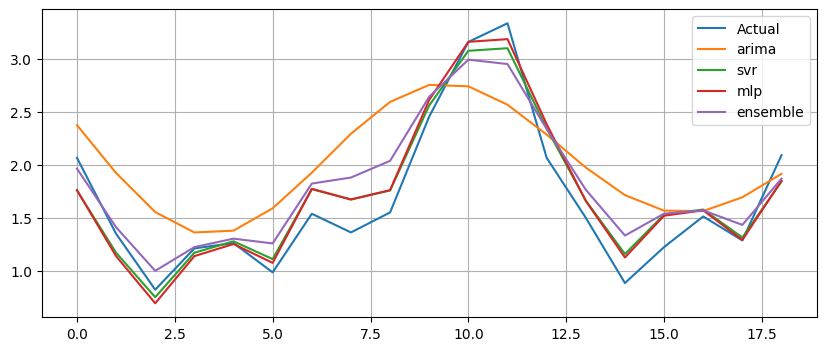

Generation 79: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821912680073383
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6909757785459825
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111626087430161
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1705792264949941
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528478410957799
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'rbf', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.5113861974567189
SVRModel {'kernel'

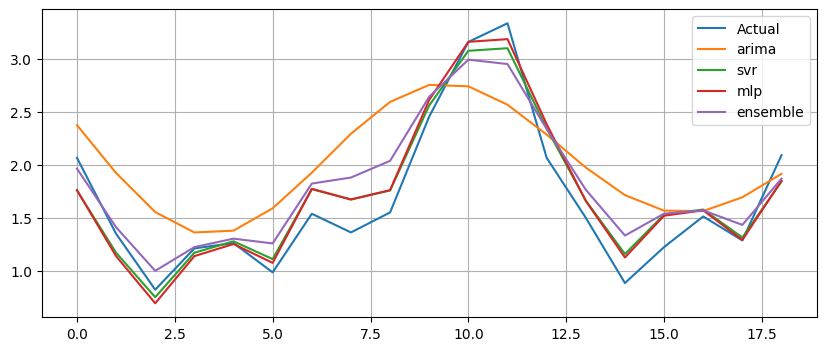

Generation 80: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1705792264949941
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682193761289297
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823966593012998
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6829737180362536
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547138133600447
SVRModel {'kernel': 'linear', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528467458111876
SVRModel {'kernel': 'linear', 'c': 59.78540720145443, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kerne

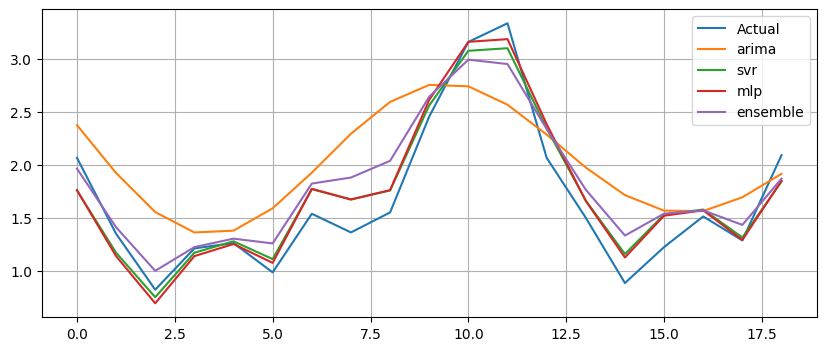

Generation 81: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6905575183962291
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823352878141573
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111630983134037
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0935293880845094
SVRModel {'kernel': 'rbf', 'c': 57.453098837097265, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4909458403470692
SVRModel {'kernel': 'linear', 'c': 56.6017902648037, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528445364517358
SVRModel {'kernel': 'linear', 'c': 58.7507366651315, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel':

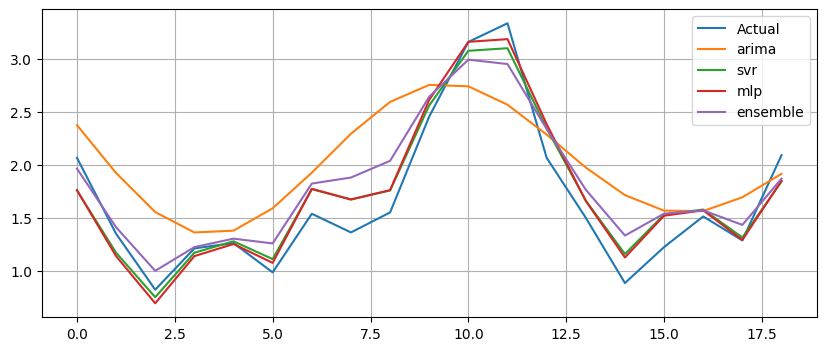

Generation 82: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.11150248217792
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682171288120945
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1705792264949941
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811770642520014
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813537275607433
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111632760879062
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'poly', 'c': 56.18593362328531, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1428328569847552
SVRModel {'kernel': 'linear', 'c': 57.22060415960824, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528468069643617
SVRModel {'kernel': 'linear', 'c': 56.96563407654714, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547138133600447
SVRModel {'kernel': 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


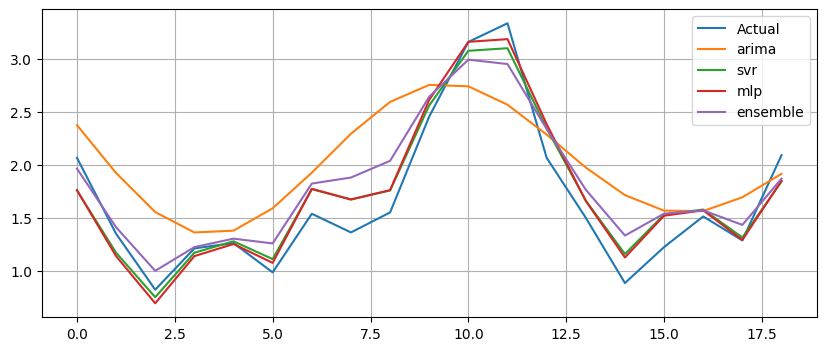

Generation 83: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1551486146921737
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0935293880845094
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6910532992755116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682224450102435
SVRModel {'kernel': 'linear', 'c': 56.191667530632216, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.191667530632216, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 56.382262122222855, 'gamma': 'scale', 'epsilon': 0.4814516569976238} Fitness: 4.51703669176628

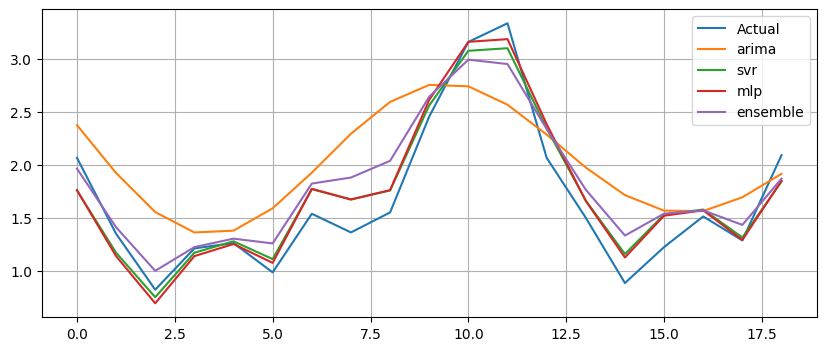

Generation 84: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8382969854081976
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821867449051704
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6917629570071204
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817457514431697
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682393972157433
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.96310696114173, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.67432782330905
SVRModel {'kernel': 'linear', 'c': 56.95811162010736, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.553603324416709
SVRModel {'kernel': 'linear', 'c': 56.52118560924443, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528467475931602
SVRModel {'kernel

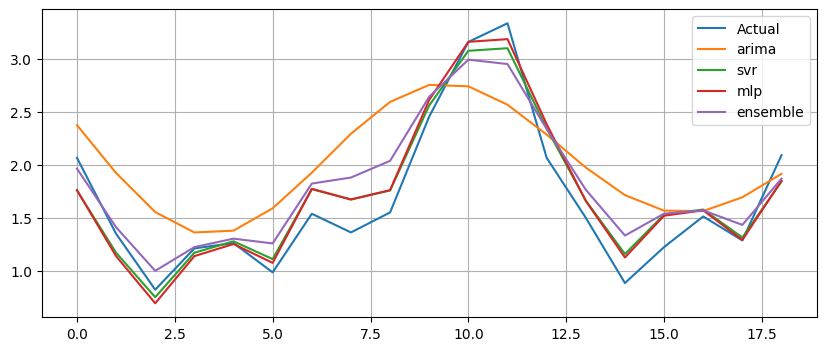

Generation 85: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812050915340186
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6905575183962291
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682287622496715
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823605837926414
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0939156660973421
SVRModel {'kernel': 'linear', 'c': 60.68599308985211, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 59.44355430959972, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.534731247804293
SVRModel {'kernel': 'rbf', 'c': 59.086450870943715, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4909458403470692
SVRModel {'kernel

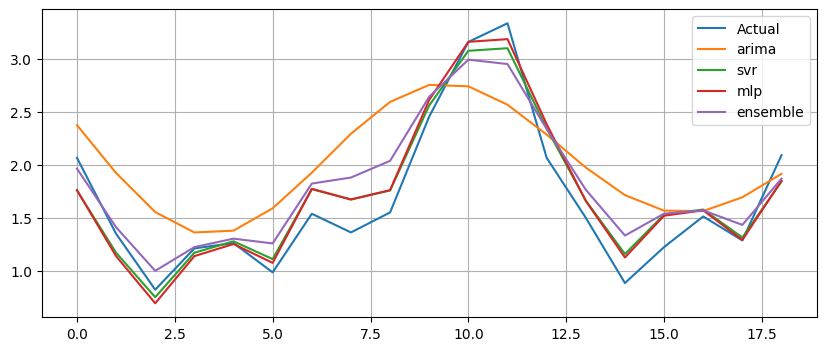

Generation 86: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2410010818011052
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823731876909818
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8382969854081976
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111633304436641
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 57.28364936093247, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.543205810174301
SVRModel {'kernel': 'linear', 'c': 59.3615020431847, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 69.84366526182941, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


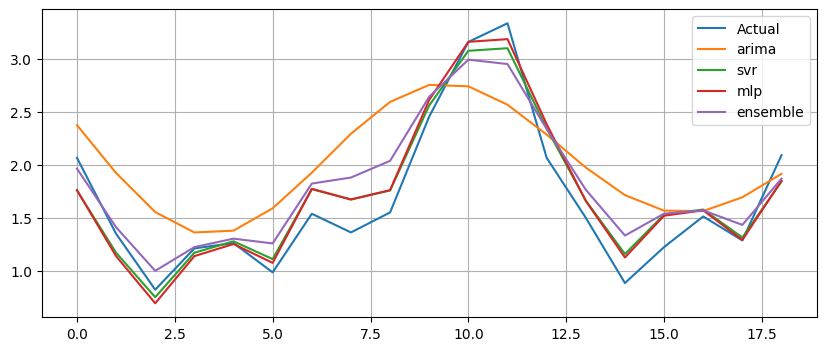

Generation 87: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6809046498541418
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6855382820566973
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 56.96310696114173, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 60.20385011932756, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 69.84366526182941, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kern

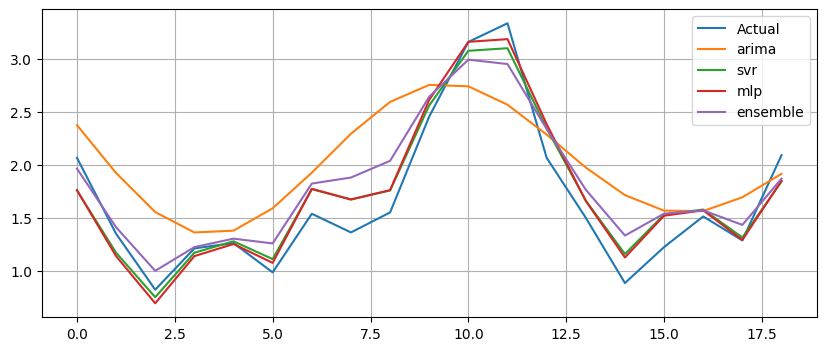

Generation 88: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6905575183962291
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2514998245924729
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 64.9478128850337, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'rbf', 'c': 62.45618355257571, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4909458403470692
SVRModel {'kernel': 'linear', 'c': 63.026329140377676, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


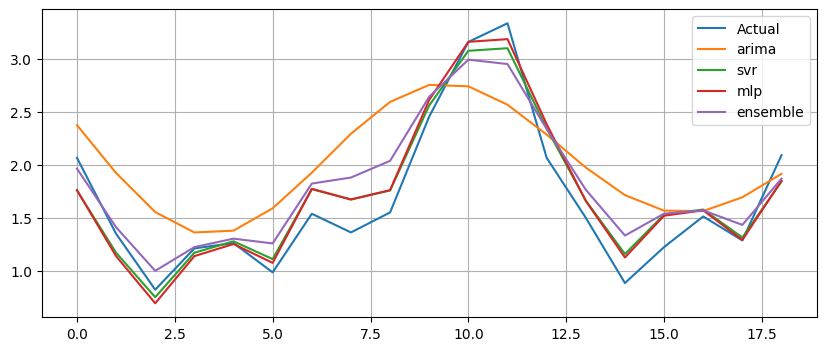

Generation 89: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679292757306224
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.540733726934335
SVRModel {'kernel': 'linear', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


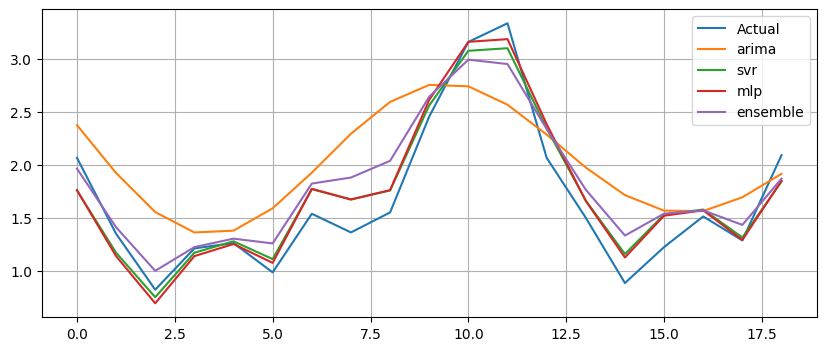

Generation 90: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6905575183962291
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6862953105853842
SVRModel {'kernel': 'linear', 'c': 59.42838128097182, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 60.7974082658078, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546756108069892
SVRModel {'kerne

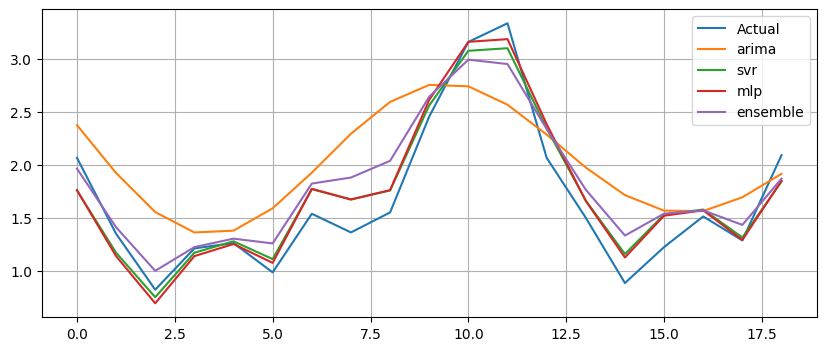

Generation 91: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821336604524024
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823361950812004
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821617703196954
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822741594728303
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823863791429312
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682183045643226
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528459221423655
SVRModel {'kernel': 'linear', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kerne

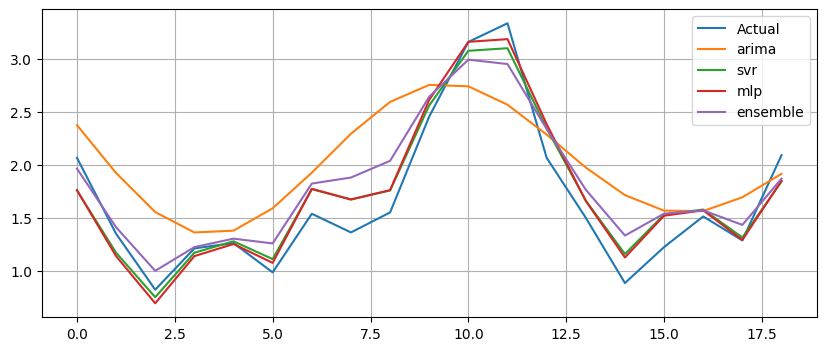

Generation 92: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6853701508794978
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111636894107286
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0884120621230653
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6842666026905029
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681174527055742
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 59.42838128097182, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.545160175039567
SVRModel {'kernel': 'linear', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'poly', 'c': 64.01893321596918, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1428835109782853
SVRModel {'kernel'

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


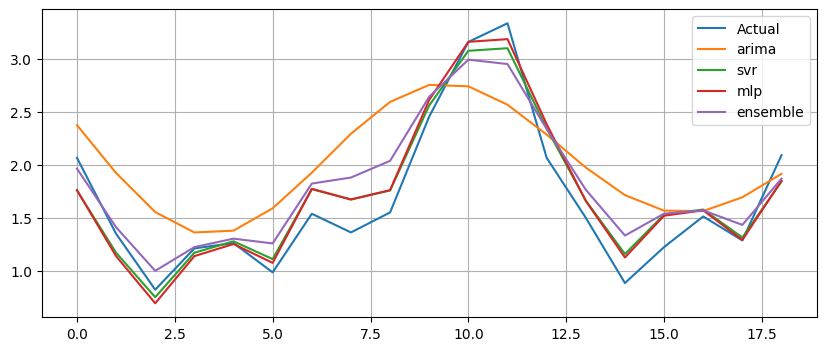

Generation 93: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682169770189837
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811721286390158
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6829737180362536
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 59.42838128097182, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528468580067439
SVRModel {'kernel': 'linear', 'c': 59.42838128097182, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.532522981829707
SVRModel {'kernel': 'linear', 'c': 62.33586369527392, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


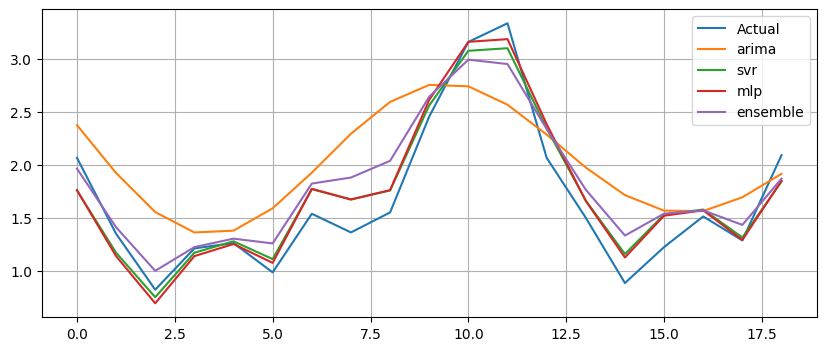

Generation 94: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0884120621230653
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68215736625507
SVRModel {'kernel': 'linear', 'c': 62.33586369527392, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 61.12592724755156, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 61.12592724755156, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


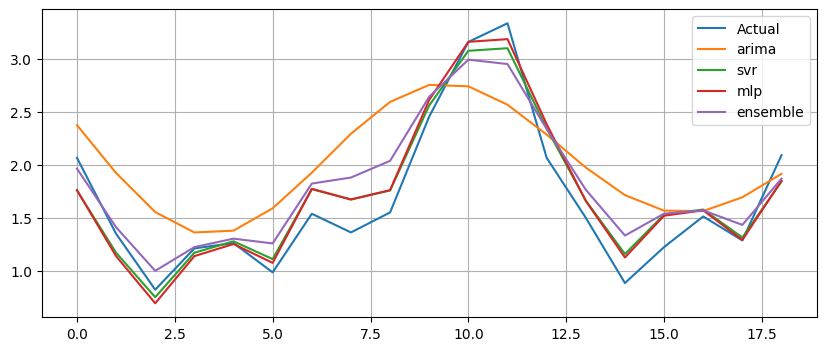

Generation 95: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6809046498541418
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811745304425534
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 60.70903652012336, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 60.862199201615326, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 59.42838128097182, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'ker

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


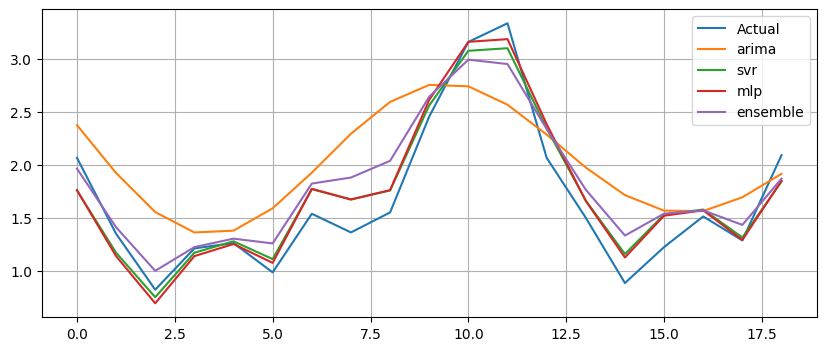

Generation 96: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.154522758110794
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0905894215366638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550110775564686
SVRModel {'kernel': 'linear', 'c': 62.03144569652393, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.546766037081289
SVRModel {'kernel': 'linear', 'c': 56.49077903060042, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 62.03144569652393, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


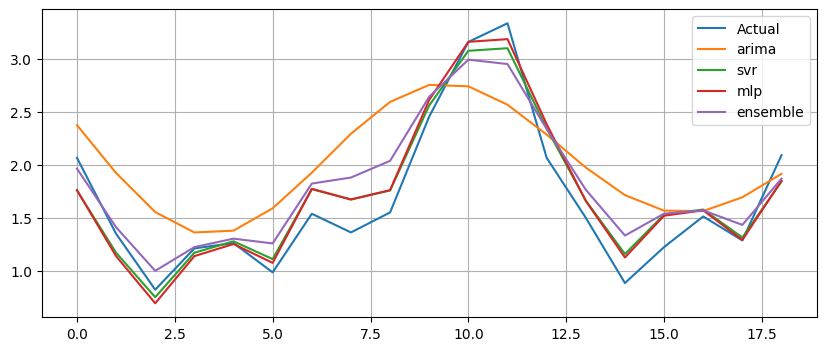

Generation 97: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6842666026905029
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822871568517073
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111635334783975
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813537275607433
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6827801134476075
SVRModel {'kernel': 'linear', 'c': 60.25642587190824, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 61.20340110558752, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.537490963408887
SVRModel {'kernel': 'linear', 'c': 60.169972398631764, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5284449047395485
SVRModel {'ker

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


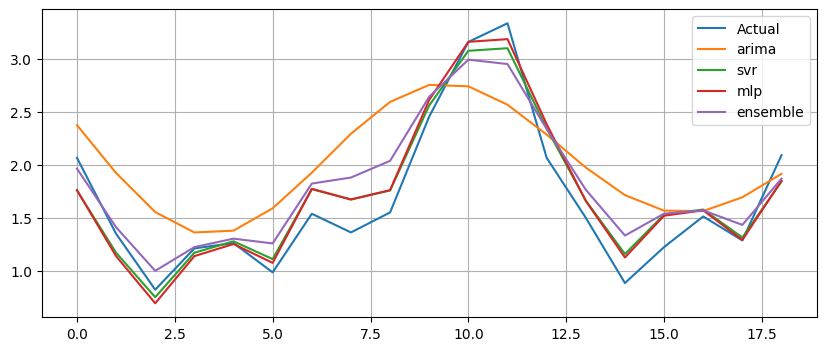

Generation 98: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0884120621230653
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823561670146023
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6904579407220188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681588568090696
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2494148691205986
SVRModel {'kernel': 'linear', 'c': 59.46061603003681, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 60.13773764956677, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 61.067686003532465, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.553564661583414
SVRModel {'kern

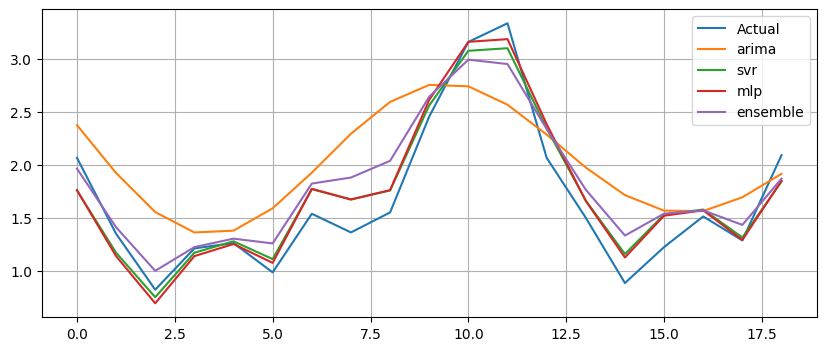

Generation 99: Fitness = 2.94266




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821508600156923
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0935293880845094
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
SVRModel {'kernel': 'linear', 'c': 61.71642317251393, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528456961054241
SVRModel {'kernel': 'linear', 'c': 61.38270852754246, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 62.03144569652393, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kern

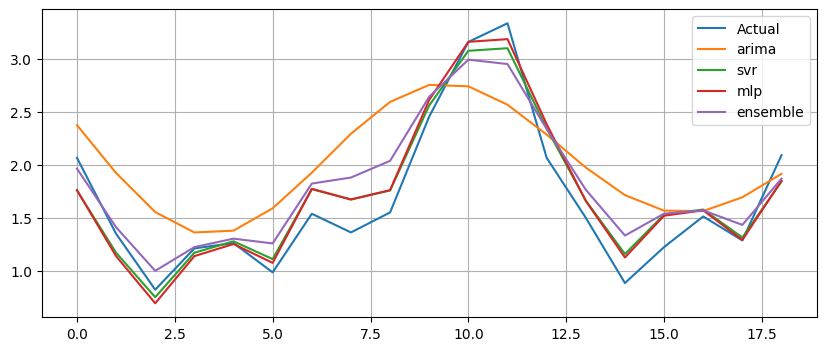

Generation 100: Fitness = 2.94266




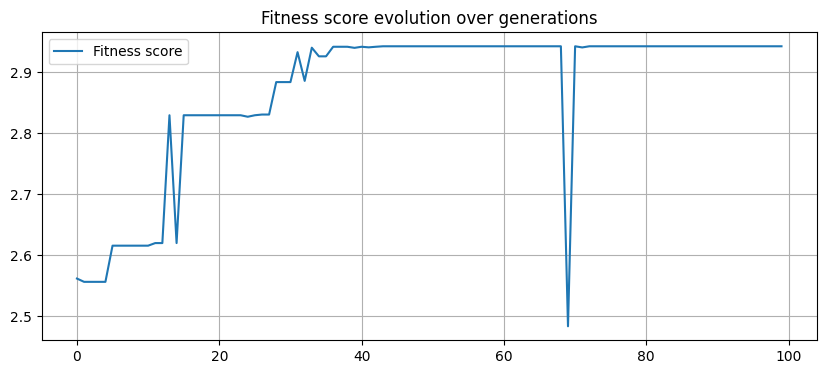

In [17]:
pool_of_models = [ArimaModel, SVRModel, MLPModel]
population_size = 10
num_generations = 100
mutation_rate = 0.2

print('Initializing population...')
population = init_population(population_size, pool_of_models)

print('Population created: ')
print_population(population)

fitness_score_collection = []

for generation in range(num_generations):

    # individual_evaluation(population, data)
    individual_evaluation_with_diversity(population, X_train_scaled, y_train_scaled, X_val_scaled, y_val_scaled)
    print_population(population)

    fitness_score, _, _, _ = team_evaluation(population, X_val_scaled, y_val_scaled)
    fitness_score_collection.append(fitness_score)

    print(f"Generation {generation + 1}: Fitness = {fitness_score:.5f}")
    print('=============================\n\n')

    # Selection by tournament
    selected_pop = tournament_selection(population)
    # print('selected population:')
    # print_population(selected_pop)

    # Crossover
    crossed_pop = crossover(selected_pop)
    # print('Crossed population:')
    # print_population(crossed_pop)
    
    # Mutation
    population = mutation(crossed_pop)
    # print_population(population)

plt.figure(figsize=(10, 4))
plt.plot(fitness_score_collection, label='Fitness score')
plt.title('Fitness score evolution over generations')
plt.grid()
plt.legend()
plt.show()

# Test

In [18]:
individual_evaluation_with_diversity(population, X_train_scaled, y_train_scaled, X_val_scaled, y_val_scaled)
print_population(population)


print('Best models:')
best_models = {}
# Select the best individual of each subpopulation
for model in population.keys():
    best_ind = None
    for individual in population[model]:
        best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
    
    best_models[best_ind.get_name()] = best_ind

best_models

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682887123045504
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6823618532978541
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1673299865772937
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678594211912636
SVRModel {'kernel': 'linear', 'c': 53.07398393214514, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.537077530962881
SVRModel {'kernel': 'linear', 'c': 59.77191757778511, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel': 'linear', 'c': 62.03144569652393, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528443488120848
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'arima': ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682887123045504,
 'svr': SVRModel {'kernel': 'linear', 'c': 61.14389648930451, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547294853854201,
 'mlp': MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.07226446351701327} Fitness: 4.587924035660879}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


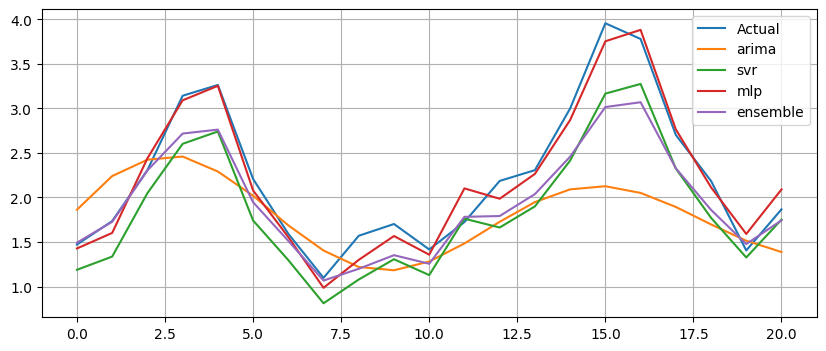

RMSE: 67.9946332843107
MSE: 4623.2701554678915


In [19]:
from sklearn.preprocessing import MinMaxScaler

X_train_val = pd.concat([X_train.copy(), X_val.copy()])
y_train_val = pd.concat([y_train.copy(), y_val.copy()])



X_train_scaler = StandardScaler()
y_train_scaler = StandardScaler()

X_train_scaled = X_train_scaler.fit_transform(np.array(X_train_val).reshape(-1,1))
X_test_scaled = X_train_scaler.transform(np.array(X_test).reshape(-1,1))

y_train_scaled = y_train_scaler.fit_transform(np.array(y_train_val).reshape(-1,1)).ravel()
y_test_scaled = y_train_scaler.transform(np.array(y_test).reshape(-1,1)).ravel()

models = {
    'arima': ArimaModel(ARIMA, best_models['arima'].hparams),
    'svr': SVRModel(SVR, best_models['svr'].hparams),
    'mlp': MLPModel(MLPRegressor, best_models['mlp'].hparams)
}

for model_name in models.keys():
    models[model_name].train(X_train_scaled, y_train_scaled)

ensemble = EnsembleModel(None, models)
pred = ensemble.predict(X_test_scaled)


models['ensemble'] = ensemble
plot_forecasts(models.values(), y_test_scaled)

pred_transf = X_train_scaler.inverse_transform(pred.reshape(-1,1))

mse = mean_squared_error(pred_transf, y_test)
rmse = np.sqrt(mean_squared_error(pred_transf, y_test))

print('RMSE: {}'.format(rmse))
print('MSE: {}'.format(mse))
